In [1]:
%%time
import pandas as pd
import numpy as np

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

In [ ]:
# Json檔轉成csv
json_data = pd.read_json("./fe_clean.json")
df = pd.DataFrame(json_data)
df.to_csv('movie_data_fe_clean.csv', index=False)


In [ ]:
# 讀取csv
df = pd.read_csv("./movie_data_fe_clean.csv")

In [ ]:
# 將空字符串替換為 NaN
df.replace("", np.nan, inplace=True)

In [ ]:
df.shape

(7315, 52)

In [ ]:
df.dtypes

id                        int64
imdb_id                  object
title                    object
vote_average            float64
vote_count                int64
status                   object
release_date             object
revenue                   int64
adj_revenue               int64
runtime                   int64
isAdult                    bool
budget                    int64
adj_budget                int64
popularity              float64
genres                   object
Action                    int64
Adult                     int64
Adventure                 int64
Animation                 int64
Biography                 int64
Comedy                    int64
Crime                     int64
Documentary               int64
Drama                     int64
Family                    int64
Fantasy                   int64
GameShow                  int64
History                   int64
Horror                    int64
Music                     int64
Musical                   int64
Mystery 

In [ ]:
xx = list(df.head(0))
yy = [
    "Action",
    "Adult",
    "Adventure",
    "Animation",
    "Biography",
    "Comedy",
    "Crime",
    "Documentary",
    "Drama",
    "Family",
    "Fantasy",
    "GameShow",
    "History",
    "Horror",
    "Music",
    "Musical",
    "Mystery",
    "News",
    "RealityTV",
    "Romance",
    "SciFi",
    "Short",
    "Sport",
    "TalkShow",
    "Thriller",
    "TV_Movie",
    "War",
    "Western",
    "other"
]


for j in yy:
    xx.remove(j)
xx

['id',
 'imdb_id',
 'title',
 'vote_average',
 'vote_count',
 'status',
 'release_date',
 'revenue',
 'adj_revenue',
 'runtime',
 'isAdult',
 'budget',
 'adj_budget',
 'popularity',
 'genres',
 'production_companies',
 'production_countries',
 'spoken_languages',
 'director',
 'writer',
 'cast',
 'rating',
 'numVotes']

In [ ]:
for j in xx:
    count = 0
    for i in df[j]:
        if i == 0:
            count += 1
    if count > 0:
        print(j, count)

# Name: isAdult, dtype: bool

vote_average 66
vote_count 66
runtime 5
isAdult 7310
popularity 1
rating 70
numVotes 70


In [ ]:
# 尚未Released, 卻有票房?!
df[df["status"] != "Released"]

,id,imdb_id,title,vote_average,vote_count,status,release_date,revenue,adj_revenue,runtime,isAdult,budget,adj_budget,popularity,genres,Action,Adult,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,Family,Fantasy,GameShow,History,Horror,Music,Musical,Mystery,News,RealityTV,Romance,SciFi,Short,Sport,TalkShow,Thriller,TV_Movie,War,Western,other,production_companies,production_countries,spoken_languages,director,writer,cast,rating,numVotes
6429,1116492,tt27351080,Dial,0.0,0,Post Production,2023-10-31,5000,5000,15,False,5000,5000,1.088,"Drama, Horror",0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Trett Films,United Kingdom,English,Josh Trett,Josh Trett,"Olivia Bourne, Denise Stephenson, Greg Lindsay...",0.0,0


In [ ]:
df = df[df["status"] == "Released"]

In [ ]:
for j in xx:
    count = 0
    for i in df[j]:
        if i == 0:
            count += 1
    if count > 0:
        print(j, count)

vote_average 65
vote_count 65
runtime 5
isAdult 7309
popularity 1
rating 69
numVotes 69


In [ ]:
# 計算每列的缺失值數量
missing_values = df.isnull().sum()

# 過濾出缺失值不等於零的列
non_zero_missing_values = missing_values[missing_values != 0]

# 顯示統計信息
print(non_zero_missing_values)

Series([], dtype: int64)


In [ ]:
df["spoken_languages"].unique()

array(['English, No Language', 'No Language', 'English',
       'English, Spanish, Yiddish', 'English, French, German, Latin',
       'French, English, German', 'Mandarin, English, French',
       'English, French', 'English, Hungarian, Latin', 'English, German',
       'English, Spanish', 'English, Latin, Hungarian, French',
       'English, Spanish, French', 'French, English',
       'French, Italian, English', 'English, Italian',
       'English, Tahitian', 'English, Russian',
       'French, English, Italian', 'Spanish, English', 'English, Hindi',
       'English, Latin', 'English, Esperanto', 'English, Welsh',
       'German, French, English', 'German, French, Italian, English',
       'English, Serbian', 'German, English', 'Japanese, English',
       'English, Italian, German', 'English, French, German',
       'English, French, German, Spanish', 'Cantonese, English',
       'English, Italian, Portuguese, Spanish', 'English, Swahili',
       'Latin, Spanish, English', 'English, S

In [ ]:
lan = []

for l in df["spoken_languages"]:
    for ll in l.split(", "):
        lan.append(ll)
lan

['English',
 'No Language',
 'English',
 'No Language',
 'No Language',
 'No Language',
 'English',
 'No Language',
 'No Language',
 'English',
 'No Language',
 'No Language',
 'No Language',
 'English',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'English',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'No Language',
 'English',
 'Spanish',
 'Yiddish',
 'English',
 'No Language',
 'English',
 'No Language',
 'No Language',
 'No Language',
 'English',
 'No Language',
 'English',
 'No Language',
 'No Language',
 'No Language',
 'English',
 'English',
 'English',
 'English',
 'English',
 'No Language',
 'English',
 'English',
 'English',
 'English',
 'French',
 'German',
 'Latin',
 'French',
 'English',
 'German',
 'English',
 'English',
 'Engl

In [ ]:
from collections import Counter

# 使用 Counter 計算每個語言的次數
language_counts = Counter(lan)

# 將結果轉換為字典，其中鍵是語言，值是出現次數
language_counts_dict = dict(language_counts)

# 將字典按照值（出現次數）降序排序
sorted_language_counts = dict(
    sorted(language_counts_dict.items(), key=lambda item: item[1], reverse=True)
)

# 輸出結果
print(sorted_language_counts)

{'English': 7230, 'Spanish': 594, 'French': 550, 'German': 338, 'Italian': 312, 'Russian': 244, 'Japanese': 134, 'Mandarin': 119, 'Arabic': 106, 'Latin': 92, 'Portuguese': 77, 'Cantonese': 57, 'No Language': 44, 'Hebrew': 36, 'Polish': 35, 'Greek': 33, 'Hungarian': 32, 'Hindi': 32, 'Korean': 31, 'Swedish': 30, 'Turkish': 27, 'Vietnamese': 26, 'Thai': 25, 'Czech': 25, 'Yiddish': 18, 'Dutch': 16, 'Romanian': 16, 'Urdu': 16, 'Ukrainian': 15, 'Swahili': 13, 'Irish': 13, 'Norwegian': 13, 'Persian': 12, 'Icelandic': 11, 'Afrikaans': 11, 'Indonesian': 11, 'Serbian': 10, 'Tagalog': 10, 'Danish': 9, 'Gaelic': 8, 'Croatian': 8, 'Georgian': 8, 'Bulgarian': 8, 'Finnish': 7, 'Tibetan': 7, 'Armenian': 7, 'Malay': 6, 'Xhosa': 6, 'Punjabi': 5, 'Esperanto': 4, 'Navajo': 4, 'Serbo-Croatian': 4, 'Slovak': 4, 'Albanian': 4, 'Somali': 4, 'Bengali': 4, 'Estonian': 4, 'Welsh': 3, 'Zulu': 3, 'Khmer': 3, 'Akan': 3, 'Haitian; Haitian Creole': 3, 'Bosnian': 3, 'Sanskrit': 3, 'Basque': 2, 'Samoan': 2, 'Nepali': 2

In [ ]:
df["spoken_languages_en"] = 0
df["spoken_languages_other"] = 0

for index, row in df.iterrows():
    if "English" in str(row["spoken_languages"]):
        df.at[index, "spoken_languages_en"] += 1
        df.at[index, "spoken_languages_other"] += row["spoken_languages"].count(",")
    else:
        df.at[index, "spoken_languages_other"] += row["spoken_languages"].count(",")
        df.at[index, "spoken_languages_other"] += 1

In [ ]:
df["spoken_languages_other"]

0        1
1        1
2        1
3        1
4        1
5        1
6        0
7        1
8        1
9        1
10       0
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       0
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       2
35       1
36       0
37       1
38       1
39       1
40       0
41       1
42       0
43       1
44       1
45       1
46       0
47       0
48       0
49       0
50       0
51       1
52       0
53       0
54       0
55       3
56       2
57       0
58       0
59       0
60       2
61       0
62       0
63       1
64       1
65       2
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0
90       0

In [ ]:
df["production_companies"].unique()

array(['Independent Moving Pictures',
       'Jesse L. Lasky Feature Play Company', 'Epoch Film Co.', ...,
       'Original Film, Columbia Pictures, Shaken, Not Stirred Productions',
       'Film4 Productions, RAW, Ffilm Cymru Wales, Ingenious Media, Topic Studios, Cornerstone Films, Stage 6 Films, Bleecker Street',
       'Fangoria Films, Channel 83 Films, Media Finance Capital, Good Wizard, Voltage Pictures'],
      dtype=object)

In [ ]:
com = []

for l in df["production_companies"]:
    for ll in l.split(", "):
        com.append(ll)
com

['Independent Moving Pictures',
 'Jesse L. Lasky Feature Play Company',
 'Epoch Film Co.',
 'Jesse L. Lasky Feature Play Company',
 'Paramount',
 'Jesse L. Lasky Feature Play Company',
 'Jesse L. Lasky Feature Play Company',
 'The Universal Film Mfg. Co.',
 'Triangle Film Corporation',
 'Wark Producing Corp.',
 'Jesse L. Lasky Feature Play Company',
 'Herbert M. Dawley Production',
 'Mabel Normand Feature Film Company',
 'Paramount',
 'Mayflower Photoplay Company',
 'Fox Film Corporation',
 'Famous Players-Lasky Corporation',
 'Charles Chaplin Productions',
 'Universal Film Manufacturing Company',
 'Hal Roach Studios',
 'Warner Bros. Pictures',
 'The Harold Lloyd Corporation',
 'Metro-Goldwyn-Mayer',
 'Douglas Fairbanks Pictures',
 'Metro-Goldwyn-Mayer',
 'Warner Bros. Pictures',
 'Charles Chaplin Productions',
 'Metro-Goldwyn Pictures Corporation',
 'Metro-Goldwyn-Mayer',
 'Metro-Goldwyn-Mayer',
 'Paramount',
 'Metro-Goldwyn-Mayer',
 'Warner Bros. Pictures',
 'Metro-Goldwyn-Mayer',
 '

In [ ]:
company_counts = Counter(com)

company_counts_dict = dict(company_counts)

sorted_company_counts = dict(
    sorted(company_counts_dict.items(), key=lambda item: item[1], reverse=True)
)

print(sorted_company_counts)

{'Warner Bros. Pictures': 626, 'Universal Pictures': 578, 'Paramount': 473, '20th Century Fox': 473, 'Columbia Pictures': 445, 'Metro-Goldwyn-Mayer': 369, 'New Line Cinema': 229, 'Walt Disney Pictures': 184, 'Touchstone Pictures': 165, 'Lionsgate': 154, 'Miramax': 147, 'United Artists': 144, 'DreamWorks Pictures': 123, 'Relativity Media': 123, 'Summit Entertainment': 122, 'TriStar Pictures': 117, 'Village Roadshow Pictures': 98, 'StudioCanal': 96, 'Focus Features': 94, 'Regency Enterprises': 92, 'Canal+': 89, 'Film4 Productions': 84, 'Working Title Films': 80, 'Screen Gems': 78, 'Dimension Films': 77, 'Fox Searchlight Pictures': 77, 'Amblin Entertainment': 75, 'Orion Pictures': 72, 'Dune Entertainment': 69, 'Blumhouse Productions': 66, 'The Weinstein Company': 65, 'Imagine Entertainment': 64, 'Millennium Media': 63, 'TSG Entertainment': 63, 'Fox 2000 Pictures': 61, 'BBC Film': 58, 'Mandate International': 57, 'Hollywood Pictures': 56, 'Scott Rudin Productions': 56, 'New Regency Picture

In [ ]:
df.shape

(7314, 54)

In [ ]:
sorted_company_counts

{'Warner Bros. Pictures': 626,
 'Universal Pictures': 578,
 'Paramount': 473,
 '20th Century Fox': 473,
 'Columbia Pictures': 445,
 'Metro-Goldwyn-Mayer': 369,
 'New Line Cinema': 229,
 'Walt Disney Pictures': 184,
 'Touchstone Pictures': 165,
 'Lionsgate': 154,
 'Miramax': 147,
 'United Artists': 144,
 'DreamWorks Pictures': 123,
 'Relativity Media': 123,
 'Summit Entertainment': 122,
 'TriStar Pictures': 117,
 'Village Roadshow Pictures': 98,
 'StudioCanal': 96,
 'Focus Features': 94,
 'Regency Enterprises': 92,
 'Canal+': 89,
 'Film4 Productions': 84,
 'Working Title Films': 80,
 'Screen Gems': 78,
 'Dimension Films': 77,
 'Fox Searchlight Pictures': 77,
 'Amblin Entertainment': 75,
 'Orion Pictures': 72,
 'Dune Entertainment': 69,
 'Blumhouse Productions': 66,
 'The Weinstein Company': 65,
 'Imagine Entertainment': 64,
 'Millennium Media': 63,
 'TSG Entertainment': 63,
 'Fox 2000 Pictures': 61,
 'BBC Film': 58,
 'Mandate International': 57,
 'Hollywood Pictures': 56,
 'Scott Rudin 

In [ ]:
# Universal Pictures
Universal = """
Universal International Pictures
DreamWorks Pictures
Focus Features
Focus World
High Top Releasing
Working Title Films
Big Idea Entertainment
Bullwinkle Studios
DreamWorks Animation
DreamWorks Classics
Illumination
Illumination Studios Paris
Universal Animation Studios
Amblin Partners
Amblin Entertainment
Amblin Television
Carnival Films
Makeready
NBCUniversal Entertainment Japan
NBCUniversal Japan
OTL Releasing
Universal Pictures Home Entertainment
United International Pictures
Universal 1440 Entertainment
WT2 Productions
Peacock
Hayu
Vudu
SkyShowtime
Classic Media
Universal Pictures International Entertainment
Working Title Television
Bullwinkle Studios
Harvey Entertainment 
"""

In [ ]:
Universal = Universal.split("\n")

In [ ]:
Universal.pop(0)
Universal.pop(-1)

''

In [ ]:
for i in Universal:
    df["production_companies"] = df["production_companies"].apply(
        lambda x: x.replace(i, "Universal Pictures")
    )

In [ ]:
# Paramount
Paramount = """
Paramount Home Entertainment
Paramount Music
Paramount Television Studios
Paramount Worldwide Television Licensing & Distribution
Paramount Global Content Distribution
Paramount Pictures
Paramount Digital Entertainment
Paramount Players
Paramount Animation
Paramount Digital Studios
Paramount Network
Paramount+
New Paramount
Paramount Vantage
Miramax
Miramax Family
Miramax Animation
Miramax Television
BET Films
MTV Entertainment Studios
Nickelodeon Movies
Republic Pictures
CBS News and Stations
CBS News Streaming Network
CBS Local Digital Media
CBS Home Entertainment
CBS Eye Animation Productions
Avatar Studios
MTV
MTV Entertainment Studios
MTV Animation
MTV Documentary Films
Nickelodeon Productions
Nickelodeon Animation Studio
Nickelodeon Digital
Awesomeness Films
Miramax Family
United International Pictures
Viacom18 Studios
Jio Studios
Pluto TV
BET+
Noggin
Nick+
JioCinema
My5
Philo
SkyShowtime
Showtime
Showtime Digital
"""

In [ ]:
Paramount = Paramount.split("\n")

Paramount.pop(0)
Paramount.pop(-1)

for i in Paramount:
    df["production_companies"] = df["production_companies"].apply(
        lambda x: x.replace(i, "Paramount")
    )

In [ ]:
# Warner Bros. Pictures
Warner = """
Warner Bros. Entertainment
Warner Bros. Studio
Warner Bros. Animation
Warner Bros. Japan Anime
Warner Bros. Pictures Animation
Warner Bros. Japan
Warner Bros. Digital Networks
Warner Bros. Home Entertainment
DC Films
Warner Bros. Pictures
Warner Bros. Family Entertainment
Warner Bros-Seven Arts
Warner Independent Pictures (WIP)
Warner Bros. Television Studios
Warner Bros. International Television Production
New Line Cinema
HBO
HBO Films
HBO Documentary Films
HBO Go
HBO Max
HBO Pictures
Spyglass Media Group
Rooster Teeth Studios
Discovery Films
TruTV Films
CNN Films
DC Studios
Cartoon Network Movies
Cartoon Network Studios
Wang Film Productions
Alloy Entertainment
DC Entertainment
Cinemax
Cinemax Films
Flagship Entertainment Group
Castle Rock Entertainment
Turner Entertainment Co.
Max
Discovery+
Discovery Digital Studios
Discovery Studios
Vudu
Philo
"""

In [ ]:
Warner = Warner.split("\n")

Warner.pop(0)
Warner.pop(-1)

for i in Warner:
    df["production_companies"] = df["production_companies"].apply(
        lambda x: x.replace(i, "Warner Bros. Pictures")
    )

In [ ]:
# Walt Disney Pictures
Disney = """
Touchstone Pictures
Fox Walt Disney Pictures
Marvel Enterprises
DisneyToon Studios
Disney Channel Original Movies
Disney Television Animation
Walt Disney Pictures
Walt Disney Pictures India
Walt Disney Studios Motion Pictures
Walt Disney Studios Sony Pictures Releasing
Walt Disney Pictures Animation
Walt Disney Feature Animation
Walt Disney Pictures Ltd.
Walt Disney Productions
Walt Disney Animation Studios
Fox Film Corporation
Fox Family Films
Fox International Productions
Fox Atomic
Hollywood Pictures
Fox 2000 Pictures
Fox Walt Disney Pictures
Fox Walt Disney Pictures
20th Century Fox
20th Century Studios
20th Century Animation
20th Century Family
A&E IndieFilms
Disneynature
Hulu Documentary Films
Searchlight Pictures
ESPN Films
NatGeo Doc Films
Lucasfilm
Lucasfilm Animation
Freeform Original Productions
Lucasfilm Animation
Marvel Film Productions
Marvel Studios
Marvel Animation
Marvel Studios Animation
Marvel Entertainment
MVL Productions
Pixar
A&E Films
Regency Enterprises
New Regency Productions
Star Studios
Vice Films
Disney+
Hulu
ESPN+
Disney+ Hotstar
Star+
Movies Anywhere
Philo
Industrial Light & Magic
"""

In [ ]:
Disney = Disney.split("\n")

Disney.pop(0)
Disney.pop(-1)

for i in Disney:
    df["production_companies"] = df["production_companies"].apply(
        lambda x: x.replace(i, "Walt Disney Pictures")
    )

In [ ]:
# Sony Pictures
Sony = """
Columbia Pictures
Sony Pictures
TriStar Pictures
Tri-Star
Sony Pictures Classics
Affirm Films
Ghost Corps
Screen Gems
Stage 6 Films
Crunchyroll, LLC
Crunchyroll Store
Crunchyroll UK and Ireland
Crunchyroll EMEA
Crunchyroll Store Australia
Madhouse
Sony Pictures Animation
Sony Pictures Imageworks
3000 Pictures
Destination Films
Left Bank Pictures
Sony Pictures Japan
Sony Pictures Releasing
Sony Pictures Worldwide Acquisitions
TriStar Productions
Walt Disney Studios Sony Pictures Releasing
Sony Pictures India
Sony Pictures Networks Productions
Sony Pictures Core
Sony Pictures Entertainment
SonyLIV
Crunchyroll
Funimation
Great American Pure Flix
Provident Films
Sony Pictures International Productions
Sony Pictures Releasing
Sony Pictures Releasing International
Sony Pictures Home Entertainment
Triumph Films
"""

In [ ]:
Sony = Sony.split("\n")

Sony.pop(0)
Sony.pop(-1)

for i in Sony:
    df["production_companies"] = df["production_companies"].apply(
        lambda x: x.replace(i, "Sony Pictures")
    )

In [ ]:
movies = [Paramount, Sony, Disney, Warner, Universal]

for i in range(len(movies)):
    for k in range(i + 1, len(movies)):
        for j in movies[i]:
            if j in movies[k]:
                print(j, "=", i, "+", k)

Philo = 0 + 2
Philo = 0 + 3
United International Pictures = 0 + 4
SkyShowtime = 0 + 4
Walt Disney Studios Sony Pictures Releasing = 1 + 2
Philo = 2 + 3
Vudu = 3 + 4


In [ ]:
# 這幾間重複, 目前未處理~


# Walt Disney Studios Sony Pictures Releasing = Columbia(JV) + Disney(JV)


# Philo = Paramount(minority stake) + Warner(minority stake) + Disney(minority stake)


# Vudu = Warner(30%) + Universal(70%)
# United International Pictures = Paramount + Universal
# SkyShowtime = Paramount + Universal

In [ ]:
com = []

for l in df["production_companies"]:
    for ll in l.split(", "):
        com.append(ll)

company_counts = Counter(com)
company_counts_dict = dict(company_counts)
sorted_company_counts = dict(
    sorted(company_counts_dict.items(), key=lambda item: item[1], reverse=True)
)

sorted_company_counts

{'Walt Disney Pictures': 1232,
 'Universal Pictures': 1035,
 'Warner Bros. Pictures': 991,
 'Sony Pictures': 804,
 'Paramount': 693,
 'Metro-Goldwyn-Mayer': 369,
 'Lionsgate': 154,
 'United Artists': 144,
 'Relativity Media': 123,
 'Summit Entertainment': 122,
 'Village Roadshow Pictures': 98,
 'StudioCanal': 96,
 'Canal+': 89,
 'Film4 Productions': 84,
 'Dimension Films': 77,
 'Fox Walt Disney Pictures': 77,
 'Orion Pictures': 72,
 'Dune Entertainment': 69,
 'Blumhouse Productions': 66,
 'The Weinstein Company': 65,
 'Imagine Entertainment': 64,
 'Millennium Media': 63,
 'TSG Entertainment': 63,
 'BBC Film': 58,
 'Mandate International': 57,
 'Scott Rudin Productions': 56,
 'New Regency Pictures': 55,
 'Ingenious Media': 55,
 'RKO Radio Pictures': 51,
 'PolyGram Filmed Entertainment': 51,
 'Silver Pictures': 50,
 'Original Film': 49,
 'Legendary Pictures': 49,
 'Malpaso Productions': 48,
 'Scott Free Productions': 48,
 'Davis Entertainment': 47,
 'Morgan Creek': 46,
 'FilmNation Enter

In [ ]:
df["production_companies_Warner"] = 0
df["production_companies_Disney"] = 0
df["production_companies_Universal"] = 0
df["production_companies_Sony"] = 0
df["production_companies_Paramount"] = 0
df["production_companies_other"] = 1

for index, row in df.iterrows():
    df.at[index, "production_companies_other"] += row["production_companies"].count(",")

    if "Warner Bros. Pictures" in str(row["production_companies"]):
        df.at[index, "production_companies_Warner"] += 1

    if "Walt Disney Pictures" in str(row["production_companies"]):
        df.at[index, "production_companies_Disney"] += 1

    if "Universal Pictures" in str(row["production_companies"]):
        df.at[index, "production_companies_Universal"] += 1

    if "Sony Pictures" in str(row["production_companies"]):
        df.at[index, "production_companies_Sony"] += 1

    if "Paramount" in str(row["production_companies"]):
        df.at[index, "production_companies_Paramount"] += 1

    df.at[index, "production_companies_other"] = (
        df.at[index, "production_companies_other"]
        - df.at[index, "production_companies_Warner"]
        - df.at[index, "production_companies_Disney"]
        - df.at[index, "production_companies_Universal"]
        - df.at[index, "production_companies_Sony"]
        - df.at[index, "production_companies_Paramount"]
    )

In [ ]:
df[
    [
        "production_companies",
        "production_companies_other",
        "production_companies_Warner",
        "production_companies_Disney",
        "production_companies_Universal",
        "production_companies_Sony",
        "production_companies_Paramount",
    ]
]

,production_companies,production_companies_other,production_companies_Warner,production_companies_Disney,production_companies_Universal,production_companies_Sony,production_companies_Paramount
0,Independent Moving Pictures,1,0,0,0,0,0
1,Jesse L. Lasky Feature Play Company,1,0,0,0,0,0
2,Epoch Film Co.,1,0,0,0,0,0
3,"Jesse L. Lasky Feature Play Company, Paramount",1,0,0,0,0,1
4,Jesse L. Lasky Feature Play Company,1,0,0,0,0,0
5,Jesse L. Lasky Feature Play Company,1,0,0,0,0,0
6,The Universal Film Mfg. Co.,1,0,0,0,0,0
7,"Triangle Film Corporation, Wark Producing Corp.",2,0,0,0,0,0
8,Jesse L. Lasky Feature Play Company,1,0,0,0,0,0
9,Herbert M. Dawley Production,1,0,0,0,0,0


In [ ]:
df["production_countries"].unique()

array(['United States of America', 'Bahamas, United States of America',
       'Italy, United States of America',
       'United States of America, Canada', 'United Kingdom',
       'United Kingdom, United States of America',
       'United States of America, France',
       'France, United States of America',
       'Switzerland, United States of America',
       'Japan, United States of America',
       'United States of America, Yugoslavia',
       'United States of America, United Kingdom, Switzerland',
       'South Africa, United Kingdom',
       'Italy, United Kingdom, United States of America',
       'France, Italy, United States of America',
       'France, United Kingdom, United States of America',
       'France, Italy',
       'Germany, United Kingdom, United States of America',
       'Mexico, United States of America',
       'Spain, United States of America', 'Italy, Soviet Union',
       'United States of America, Philippines',
       'Philippines, United States of Ame

In [ ]:
coun = []

for l in df["production_countries"]:
    for ll in l.split(", "):
        coun.append(ll)
coun

['United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'Bahamas',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'Italy',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of America',
 'United States of Am

In [ ]:
country_counts = Counter(coun)

country_counts_dict = dict(country_counts)


sorted_country_counts = dict(
    sorted(country_counts_dict.items(), key=lambda item: item[1], reverse=True)
)

sorted_country_counts

{'United States of America': 6707,
 'United Kingdom': 1080,
 'Canada': 429,
 'France': 410,
 'Germany': 390,
 'Australia': 171,
 'Japan': 121,
 'Italy': 91,
 'China': 91,
 'Spain': 87,
 'Ireland': 75,
 'India': 57,
 'Belgium': 50,
 'Hong Kong': 49,
 'Mexico': 35,
 'Czech Republic': 34,
 'New Zealand': 32,
 'Switzerland': 31,
 'Netherlands': 31,
 'Sweden': 31,
 'South Africa': 25,
 'Denmark': 24,
 'Hungary': 24,
 'Bulgaria': 19,
 'Luxembourg': 18,
 'United Arab Emirates': 17,
 'Brazil': 13,
 'Morocco': 12,
 'South Korea': 12,
 'Russia': 12,
 'Romania': 12,
 'Norway': 11,
 'Finland': 11,
 'Poland': 9,
 'Greece': 9,
 'Singapore': 8,
 'Argentina': 7,
 'Taiwan': 7,
 'Malta': 7,
 'Thailand': 6,
 'Austria': 6,
 'Philippines': 5,
 'Iceland': 5,
 'Colombia': 5,
 'Puerto Rico': 5,
 'Turkey': 5,
 'Chile': 5,
 'Portugal': 4,
 'Malaysia': 4,
 'Soviet Union': 3,
 'Israel': 3,
 'Slovakia': 3,
 'Aruba': 3,
 'Iran': 3,
 'Serbia': 3,
 'Kenya': 3,
 'Bahamas': 2,
 'Lebanon': 2,
 'Libyan Arab Jamahiriya': 

In [ ]:
df["production_countries_USA"] = 0
df["production_countries_other"] = 0

for index, row in df.iterrows():
    if "United States of America" in str(row["production_countries"]):
        df.at[index, "production_countries_USA"] += 1
        df.at[index, "production_countries_other"] += row["production_countries"].count(
            ","
        )
    else:
        df.at[index, "production_countries_other"] += row["production_countries"].count(
            ","
        )
        df.at[index, "production_countries_other"] += 1

In [ ]:
df[["production_countries", "production_countries_USA", "production_countries_other"]]

,production_countries,production_countries_USA,production_countries_other
0,United States of America,1,0
1,United States of America,1,0
2,United States of America,1,0
3,United States of America,1,0
4,United States of America,1,0
5,United States of America,1,0
6,"Bahamas, United States of America",1,1
7,United States of America,1,0
8,United States of America,1,0
9,United States of America,1,0


In [ ]:
df[["cast"]]

,cast
0,"Jane Gail, Ethel Grandin, William H. Turner, M..."
1,"Bessie Barriscale, Jane Darwell, Dick La Reno,..."
2,"Lillian Gish, Mae Marsh, Henry B. Walthall, Mi..."
3,"Fannie Ward, Sessue Hayakawa, Jack Dean, James..."
4,"Mabel Van Buren, Theodore Roberts, House Peter..."
5,"Geraldine Farrar, Theodore Roberts, Pedro de C..."
6,"Allen Holubar, Dan Hanlon, Edna Pendleton, Cur..."
7,"Lillian Gish, Robert Harron, Mae Marsh, F.A. T..."
8,"Geraldine Farrar, Wallace Reid, Pedro de Cordo..."
9,"Alan V. Day, Chauncey A. Day, Herbert M. Dawle..."


In [ ]:
# Actor or Actress
AA = """
James Stewart
Gary Cooper
Cary Grant
Humphrey Bogart
Spencer Tracy
Burt Lancaster
Clark Gable
John Wayne
Clint Eastwood
Tom Hanks
Bing Crosby
Gregory Peck
Paul Newman
Lionel Barrymore
Harrison Ford
Fredric March
Myrna Loy
James Cagney
Bette Davis
Jack Nicholson
Meryl Streep
Henry Fonda
Robert Redford
William Holden
Olivia de Havilland
Jack Lemmon
Fred Astaire
Edward G. Robinson
Dustin Hoffman
Anthony Quinn
Tom Cruise
Charles Laughton
Marlon Brando
Gene Hackman
Matt Damon
Alec Guinness
Tyrone Power
Robert Duvall
Katharine Hepburn
William Powell
Lee J. Cobb
Brad Pitt
Samuel L. Jackson
Claudette Colbert
Mickey Rooney
Barbara Stanwyck
Vincent Price
Cate Blanchett
Ginger Rogers
Ingrid Bergman
Judy Garland
Van Johnson
Anne Baxter
Fred MacMurray
David Niven
Charlton Heston
Deborah Kerr
Walter Pidgeon
Philip Seymour Hoffman
Laurence Olivier
Kirk Douglas
Loretta Young
Frank Sinatra
Scarlett Johansson
James Mason
Glenn Ford
Morgan Freeman
Gene Kelly
Maureen O'Hara
Joseph Cotten
Denzel Washington
Leonardo DiCaprio
Ronald Colman
Errol Flynn
Susan Hayward
Lee Marvin
Marlene Dietrich
Robert Mitchum
Ray Milland
Jean Arthur
Robert DeNiro
Johnny Depp
Wallace Beery
Emma Thompson
Christopher Plummer
George Clooney
Dana Andrews
Van Heflin
Rosalind Russell
Irene Dunne
Robert Taylor
Jane Wyman
Tony Curtis
Al Pacino
Walter Matthau
Doris Day
Michael Caine
Dick Powell
Christian Bale
Bill Murray
Bob Hope
William Hurt
Greer Garson
Charles Boyer
Joan Fontaine
Jean Simmons
Liam Neeson
Mel Gibson
Robert Downey Jr.
Donna Reed
Gene Tierney
Shirley Temple
Maureen O'Sullivan
Laurence Fishburne
Sigourney Weaver
Richard Widmark
Gwyneth Paltrow
Ed Harris
Sidney Poitier
Sean Connery
John Garfield
Robert Young
Rock Hudson
Donald Sutherland
Joan Crawford
Elizabeth Taylor
Woody Allen
Audrey Hepburn
Randolph Scott
Natalie Wood
Don Ameche
Ernest Borgnine
Leslie Howard
Jeremy Renner
Dorothy McGuire
Kurt Russell
Tommy Lee Jones
Harvey Keitel
John Gielgud
John Lithgow
Diane Keaton
Robert Montgomery
Dean Martin
Joel McCrea
Josh Brolin
Albert Finney
Gary Oldman
Vivien Leigh
Montgomery Clift
Pat O'Brien
Shirley MacLaine
Richard Harris
Steve McQueen
Marilyn Monroe
Debbie Reynolds
Jeff Bridges
Jeff Goldblum
Amy Adams
Mark Ruffalo
Janet Leigh
Jane Fonda
Emma Watson
Robin Williams
Joan Blondell
Lana Turner
John Goodman
Julie Christie
Rita Hayworth
Monty Woolley
Woody Harrelson
June Allyson
Anthony Hopkins
Jude Law
Daniel Day-Lewis
Orson Welles
James Garner
Bruce Dern
Peter O'Toole
Anne Bancroft
Eleanor Parker
Jennifer Jones
Joan Bennett
Lucille Ball
Bill Paxton
Michelle Pfeiffer
Robert Cummings
Julianne Moore
Danny DeVito
Julie Andrews
Richard Burton
Alice Faye
Bruce Willis
Jeanette MacDonald
Betty Grable
Kevin Bacon
Jeff Daniels
Alan Ladd
Paulette Goddard
John Barrymore
Jon Voight
Chris Pratt
George Raft
Danny Glover
Forest Whitaker
Donald O'Connor
Teresa Wright
Deanna Durbin
Sally Field
Adam Driver
Russell Crowe
Grace Kelly
Tom Hardy
Lauren Bacall
Mary Pickford
Kevin Costner
José Ferrer
Michael Douglas
Steve Carell
Viggo Mortensen
Colin Firth
Ann Sheridan
Ben Kingsley
Seth Rogen
Danny Kaye
Chris Hemsworth
Susan Sarandon
Joe E. Brown
Jodie Foster
Frances McDormand
Lillian Gish
Janet Gaynor
Ruth Hussey
Robert Wagner
Ewan McGregor
Albert Brooks
Ava Gardner
Rex Harrison
Douglas Fairbanks Jr.
Linda Darnell
Jessica Tandy
Richard Dreyfuss
Sissy Spacek
Edward Norton
Kevin Spacey
George C. Scott
Greta Garbo
Orlando Bloom
Carrie Fisher
Nicole Kidman
Laura Dern
Abbott & Costello
Mark Hamill
Simon Pegg
Kate Winslet
Gloria Grahame
Broderick Crawford
Boris Karloff
Ben Affleck
Helen Mirren
Vin Diesel
Dennis Hopper
Glenn Close
Ida Lupino
Christopher Walken
Rod Steiger
Jeanne Crain
Paul Muni
James Caan
Dennis Morgan
Barbra Streisand
Robert Shaw
Rod Taylor
Julia Roberts
Keira Knightley
Bradley Cooper
Margaret O'Brien
Joseph Gordon-Levitt
Clifton Webb
Victor Mature
Charles Chaplin
Jack Black
Mark Wahlberg
Betty Hutton
Jean Harlow
Mel Brooks
Sean Penn
Joaquin Phoenix
Tim Robbins
Chiwetel Ejiofor
Cliff Robertson
Hugh Jackman
Michael Keaton
Jerry Lewis
Eddie Murphy
Jennifer Lawrence
Robert Walker
Karen Gillan
Viola Davis
Debra Paget
Sam Rockwell
James Coburn
Sal Mineo
Jim Carrey
Benicio Del Toro
Cyd Charisse
Ellen Burstyn
Norma Shearer
Bryan Cranston
Carole Lombard
Merle Oberon
John Malkovich
Daniel Craig
Whoopi Goldberg
Dick Van Dyke
John Cusack
Virginia Mayo
Daniel Radcliffe
Peter Sellers
Hugh Grant
Steve Martin
Will Smith
Jessica Chastain
Owen Wilson
Ann Miller
George Segal
Chris Evans
James Dean
Ryan Gosling
Michael Shannon
Nicolas Cage
Keanu Reeves
Matthew McConaughey
Geena Davis
Cornel Wilde
Gene Wilder
Patricia Neal
Jake Gyllenhaal
Ronald Reagan
Red Skelton
Dan Aykroyd
Zoe Saldana
Sylvia Sidney
Tom Holland
Sylvester Stallone
Matthew Broderick
Kevin Kline
Alan Arkin
Nick Nolte
Holly Hunter
Anthony Perkins
Ben Stiller
Vanessa Redgrave
Idris Elba
Kay Francis
Elliott Gould
James McAvoy
Toni Collette
Omar Sharif
Dennis Quaid
Faye Dunaway
Martin Sheen
Warren Beatty
Nelson Eddy
Annette Bening
Emily Blunt
Lee Remick
Laurel and Hardy
Paul Rudd
Richard Pryor
Billy Dee Williams
Oscar Levant
Richard Gere
Marie Dressler
John Travolta
Renée Zellweger
Veronica Lake
Natalie Portman
Hedy Lamarr
Helen Hayes
Drew Barrymore
Robert Donat
Joanne Woodward
Jamie Foxx
Emma Stone
Cameron Diaz
Kim Novak
Jessica Lange
Sandra Bullock
Anne Hathaway
Michael Fassbender
Red Buttons
Burt Reynolds
Laura Linney
Kathryn Grayson
Margaret Sullavan
Dwayne Johnson
Buster Keaton
James Franco
Esther Williams
Ethan Hawke
Oprah Winfrey
Hayley Mills
Oscar Isaac
Chris Pine
Charles Bronson
Angela Bassett
Lena Horne
Jeremy Irons
Priscilla Lane
Geraldine Page
Colin Farrell
Eva Marie Saint
Roy Scheider
Yul Brynner
Arnold Schwarzenegger
Marx Brothers
Charlize Theron
Shia LaBeouf
Margot Robbie
Farley Granger
Malcolm McDowell
Eleanor Powell
Winona Ryder
Heath Ledger
Tony Randall
Michael J. Fox
Howard Keel
Jennifer Connelly
Antonio Banderas
Leslie Caron
Brian Keith
Alan Alda
Joel Edgerton
Rhonda Fleming
Jeff Chandler
Gail Russell
Brie Larson
Channing Tatum
Rachel Weisz
Andy Garcia
Angelina Jolie
Jared Leto
John Candy
Anna Kendrick
Goldie Hawn
Candice Bergen
William Shatner
Diane Lane
Yvonne De Carlo
Reese Witherspoon
Billy Crystal
Mitzi Gaynor
Harry Belafonte
Eddie Redmayne
Richard Egan
Sophia Loren
Val Kilmer
June Haver
Sandra Dee
Lizabeth Scott
Gal Gadot
Ann-Margret
Adam Sandler
Kevin Hart
John Krasinski
Debra Winger
Cher
Jane Russell
Tim Allen
Kathleen Turner
Audie Murphy
Halle Berry
Jason Bateman
Elvis Presley
Jamie Lee Curtis
Meg Ryan
Will Ferrell
Pierce Brosnan
Sonja Henie
Helen Hunt
Glenda Jackson
Matt Dillon
Jane Powell
George Peppard
Vince Vaughn
Demi Moore
Mae West
Ice Cube
Denis Leary
Melanie Griffith
Dorothy Dandridge
Wesley Snipes
Jennifer Garner
Kim Basinger
Ryan Reynolds
Taraji P. Henson
Peter Fonda
Paul Walker
Bette Midler
Liza Minnelli
Robert Pattinson
Kate Beckinsale
Gina Lollobrigida
Tab Hunter
Chevy Chase
Penélope Cruz
Gerard Butler
Melissa McCarthy
Charlie Sheen
Rutger Hauer
Ryan O'Neal
Martin Lawrence
Jason Statham
Michael B. Jordan
Marsha Mason
Carol Burnett
Roger Moore
Frances Farmer
Luke Wilson
Macaulay Culkin
Angie Dickinson
Jennifer Aniston
Mickey Rourke
Dyan Cannon
Jennifer Lopez
Christopher Reeve
Christian Slater
Pam Grier
Brendan Fraser
Andy Samberg
Jim Brown
Christina Ricci
Michael Biehn
George Arliss
Sharon Stone
Regina Hall
Andy Griffith
Justin Timberlake
Blake Lively
Hilary Swank
Tyler Perry
Patrick Swayze
Steve Guttenberg
Mila Kunis
Rami Malek
Raquel Welch
Dudley Moore
Anna Faris
Art Carney
Sondra Locke
Deepika Padukone
Zac Efron
Jayne Mansfield
Steven Seagal
Milla Jovovich
Emilio Estevez
Annette Funicello
Jean-Claude Van Damme
Molly Ringwald
Tim Conway
Tom Selleck
Dan Patrick
Chuck Norris
Judd Nelson
"""

In [ ]:
AA = AA.split("\n")

AA.pop(0)
AA.pop(-1)

df["starts564"] = 0

for index, row in df.iterrows():
    for i in AA:
        if i in str(row["cast"]):
            df.at[index, "starts564"] += 1

In [ ]:
AA = AA[:300]

df["starts300"] = 0

for index, row in df.iterrows():
    for i in AA:
        if i in str(row["cast"]):
            df.at[index, "starts300"] += 1

In [ ]:
AA = AA[:100]

df["starts100"] = 0

for index, row in df.iterrows():
    for i in AA:
        if i in str(row["cast"]):
            df.at[index, "starts100"] += 1

In [ ]:
df["starts300"] = df["starts300"] - df["starts100"]

In [ ]:
df["starts564"] = df["starts564"] - df["starts300"] - df["starts100"]

In [ ]:
df[["cast", "starts564", "starts300", "starts100"]]

,cast,starts564,starts300,starts100
0,"Jane Gail, Ethel Grandin, William H. Turner, M...",0,0,0
1,"Bessie Barriscale, Jane Darwell, Dick La Reno,...",0,0,0
2,"Lillian Gish, Mae Marsh, Henry B. Walthall, Mi...",0,1,0
3,"Fannie Ward, Sessue Hayakawa, Jack Dean, James...",0,0,0
4,"Mabel Van Buren, Theodore Roberts, House Peter...",0,0,0
5,"Geraldine Farrar, Theodore Roberts, Pedro de C...",0,0,0
6,"Allen Holubar, Dan Hanlon, Edna Pendleton, Cur...",0,0,0
7,"Lillian Gish, Robert Harron, Mae Marsh, F.A. T...",0,1,0
8,"Geraldine Farrar, Wallace Reid, Pedro de Cordo...",0,0,0
9,"Alan V. Day, Chauncey A. Day, Herbert M. Dawle...",0,0,0


In [ ]:
print("starts564:", sum(df["starts564"].values))
print("starts300:", sum(df["starts300"].values))
print("starts100:", sum(df["starts100"].values))

starts564: 3463
starts300: 2775
starts100: 1544


In [ ]:
df["director"].unique()

array(['George Loane Tucker', 'Cecil B. DeMille', 'D.W. Griffith', ...,
       'Shaka King', 'Euros Lyn', 'Joe Begos'], dtype=object)

In [ ]:
# director

Directors = """
Steven Spielberg
James Cameron
Anthony Russo
Joe Russo
Peter Jackson
Michael Bay
David Yates
Christopher Nolan
J.J. Abrams
Ridley Scott
Tim Burton
Robert Zemeckis
Jon Favreau
Ron Howard
Sam Raimi
Chris Columbus
Roland Emmerich
Jon Watts
James Wan
Pierre Coffin
Bryan Singer
Gore Verbinski
Francis Lawrence
George Lucas
Brad Bird
Clint Eastwood
Chris Renaud
Todd Phillips
Zack Snyder
M. Night Shyamalan
Kyle Balda
Sam Mendes
Carlos Saldanha
Bill Condon
Justin Lin
Joss Whedon
Tom McGrath
Chris Buck
Andrew Stanton
Guy Ritchie
Jennifer Lee
Shawn Levy
Rob Marshall
James Gunn
Colin Trevorrow
Andrew Adamson
Conrad Vernon
John Lasseter
Eric Darnell
Barry Sonnenfeld
James Mangold
Ryan Coogler
Steven Soderbergh
Tsui Hark
Martin Scorsese
Kaige Chen
Christopher McQuarrie
Jon Turteltaub
Pete Docter
F. Gary Gray
Richard Donner
Joseph Kosinski
Matt Reeves
Jake Kasdan
Peyton Reed
Brett Ratner
Byron Howard
Tony Scott
David Fincher
Martin Campbell
Rob Minkoff
Andy Wachowski
Zhang Yimou
Rich Moore
Louis Leterrier
Kenneth Branagh
Quentin Tarantino
Chen Sicheng
Raja Gosnell
David Leitch
Lee Unkrich
Rian Johnson
Wolfgang Petersen
Dante Lam
Ivan Reitman
Dennis Dugan
Jay Roach
Mike Newell
Garry Marshall
Taika Waititi
Ron Clements
Greta Gerwig
Mike Mitchell
Joe Johnston
Marc Forster
John Musker
Ang Lee
Gareth Edwards
Rob Letterman
Joel Schumacher
Paul W.S. Anderson
Alfonso Cuarón
Dean DeBlois
Ruben Fleischer
Juan Antonio Bayona
Robert Rodriguez
Andy Muschietti
Paul Greengrass
Peter Berg
Tom Shadyac
Antoine Fuqua
Stephen Sommers
Marc Webb
Matthew Vaughn
Peter Farrelly
Doug Liman
Chris Weitz
Fan Guo
Kelly Asbury
Lana Wachowski
Shane Black
Bobby Farrelly
Jon M. Chu
Steve Martino
Tim Story
Hao Ning
Chris Sanders
Jaume Collet-Serra
Aaron Horvath
Rob Cohen
Scott Derrickson
Edward Zwick
Genndy Tartakovsky
Barry Levinson
Michael Jelenic
Chris Miller
Nancy Meyers
John Woo
Kirk Wise
Brad Peyton
Woody Allen
Oliver Stone
Sylvester Stallone
Joachim Ronnin
Hu Guan
Sydney Pollack
Luc Besson
Jan De Bont
George Miller
Guillermo del Toro
John McTiernan
Phil Lord
Christopher Miller
Hayao Miyazaki
Phillip Noyce
Paul Feig
Jennifer Yuh Nelson
Peter Segal
Renny Harlin
Gary Ross
Adam Shankman
Baz Luhrmann
Roger Allers
Michael Apted
Joel Coen
Simon West
Mel Gibson
Ryan Fleck
Muye Wen
Anna Boden
David Ayer
David Silverman
Robert Schwentke
Joseph McGinty Nichol
Alan Taylor
Josh Cooley
Denis Villeneuve
Paul Verhoeven
Wu Jing
Jonathan Liebesman
Lasse Hallström
Patty Jenkins
Mike Nichols
Michael Mann
Brian De Palma
Garth Jennings
Tim Miller
Peter Sohn
Tyler Perry
Chad Stahelski
Stephen Chow
Betty Thomas
Tom Hooper
Frank Coraci
Chris Williams
Francis Ford Coppola
Tim Johnson
John Landis
Danny Boyle
Rawson Marshall Thurber
Rob Reiner
Andy Tennant
Gary Trousdale
David F. Sandberg
Adrian Lyne
Andrew Davis
Adam McKay
Wes Ball
Xu Zheng
James Foley
Jerry Zucker
Paul Weitz
David O. Russell
D.J. Caruso
Wes Craven
John Glen
Brian Levant
Kevin Lima
Mark Waters
Don Hall
Michael Thurmeier
Will Gluck
Nora Ephron
Peter Weir
Alejandro Gonzalez Inarritu
Vicky Jenson
Makoto Shinkai
Seth MacFarlane
Chuck Russell
Darren Aronofsky
Jia Ling
Nicholas Stoller
John Badham
Espen Sandberg
David Gordon Green
David Frankel
Len Wiseman
Cary Joji Fukunaga
Kevin Reynolds
Robert Luketic
David Slade
Tim Hill
Frank Oz
Brenda Chapman
Brad Silberling
Robert Stromberg
Cameron Crowe
Roger Donaldson
Alex Proyas
Malcolm D. Lee
Dan Scanlon
Yang Yu
John G. Avildsen
Joe Wright
Lee Tamahori
Mark Osborne
Seth Gordon
Jonathan Mostow
John Stevenson
Irvin Kershner
Neill Blomkamp
Raman Hui
Yibai Zhang
William Friedkin
Steve Carr
Timur Bekmambetov
Sean Anders
Jonathan Demme
Curtis Hanson
Chris Wedge
Michael Patrick King
Jeff Fowler
David Zucker
Phyllida Lloyd
Judd Apatow
Jason Reitman
Joel Crawford
John Singleton
Kemp Powers
Justin K. Thompson
Joaquim Dos Santos
Peter Ramsey
Jordan Peele
Roger Spottiswoode
Anne Fletcher
Alan J. Pakula
Keenen Ivory Wayans
Wong Jing
Stephen Herek
John Madden
Steven Caple Jr
Donald Petrie
Damien Chazelle
James Bobin
Walt Becker
Herman Yau
Wuershan
Taylor Hackford
John Krasinski
Xue Xiaolu
Andrew Lau
Andy Fickman
David Dobkin
Ben Stiller
James L. Brooks
Larry Charles
Wes Anderson
Stephen Frears
Harold Ramis
Han Han
Catherine Hardwicke
Michael Chaves
Duncan Jones
Gavin Hood
Spike Lee
Herbert Ross
Nathan Greno
Karey Kirkpatrick
John Lee Hancock
Sam Taylor-Johnson
Mick Jackson
Norman Jewison
Ol Parker
Kirk De Micco
Jeff Tremaine
Shen Ao
Baltasar Kormakur
Rupert Sanders
Randal Kleiser
Neil Burger
Jordan Vogt-Roberts
Jim Abrahams
Harald Zwart
Mark Andrews
Robert Wise
Peter Hyams
Morten Tyldum
Nick Cassavetes
Richard Marquand
Martin Brest
Travis Knight
Adam Wingard
Guy Hamilton
Emile Ardolino
Ethan Coen
Roger Michell
Anthony Minghella
Gabriele Muccino
Haruo Sotozaki
Phil Johnston
Kent Seki
Wilson Yip
Yan Han
Tarsem Singh
Ben Affleck
P.J. Hogan
Alessandro Carloni
Rupert Wyatt
Olivier Nakache
Eric Toledano
Amy Heckerling
Kevin Costner
Scott Mosier
Yarrow Cheney
Alexander Payne
Destin Daniel Cretton
Mimi Leder
Andy Serkis
Steve Hickner
Jean-Jacques Annaud
Darren Lynn Bousman
Xiang Liu
Daniel Espinosa
Walter Hill
John Moore
Rui Cui
David Bowers
Tate Taylor
Dominic Sena
Mark Dindal
Elizabeth Banks
Sharon Maguire
Gus Van Sant
Cal Brunker
Michael Gracey
Jon Amiel
Mark Steven Johnson
George Cukor
Chengpeng Dong
Xiaozhi Rao
Penny Marshall
Nick Park
Neil Jordan
Takashi Yamazaki
Daniel Lee
Brian Robbins
Xiaogang Feng
Joseph Ruben
Greg Tiernan
Patrick Hughes
Robert Redford
Chiyu Zhang
Terry Gilliam
Edgar Wright
Les Mayfield
Tony Gilroy
Wolfgang Reitherman
Peter Chelsom
David R. Ellis
Joe Dante
Dean Parisot
Olivier Megaton
Joon-ho Bong
Tian Yusheng
Chirs Buck
Eric Brevig
Paul King
Michael Dougherty
Chloé Zhao
George Roy Hill
S.S. Rajamouli
Ariel Schulman
Henry Joost
Eli Roth
Roman Polanski
Stephen Hopkins
Blake Edwards
Clyde Geronimi
Arthur Hiller
Bradley Cooper
Victor Fleming
Craig Gillespie
Joel Zwick
John Francis Daley
Jonathan Goldstein
Jean-Pierre Jeunet
Marc Lawrence
George P. Cosmatos
Bilall Fallah
Adil El Arbi
Alex Kurtzman
Jimmy Hayward
Josh Gordon
Will Speck
Wang Baoqiang
Brian Helgeland
Frank Darabont
David Soren
Jason Friedberg
Steve Oedekerk
Sam Wood
Ben Wheatley
Lawrence Kasdan
Bruce Beresford
Mikael Hafstrom
Michael Lembeck
Pedro Almodovar
Thor Freudenthal
Tyler Gillett
Matt Bettinelli-Olpin
Mike Thurmeier
Ken Kwapis
Leonard Nimoy
Bibo Bergeron
Stanley Tong
Simon Wells
Stanley Kubrick
Mel Brooks
Xing Wenxiong
Cate Shortland
Stephen Daldry
Brian Fee
George Clooney
John Hamburg
Adam Robitel
Sidney Lumet
Jill Culton
Albert Hughes
Kathryn Bigelow
Sam Fell
John Pasquin
Bob Persichetti
Rodney Rothman
Pierre Morel
Kirk Jones
Don Bluth
Florian Henckel von Donnersmarck
Michel Gondry
Stephen Gaghan
Tom Dey
Richard Curtis
Simon J. Smith
Lu Yang
Steve Miner
Ralph Zondag
Corin Hardy
Peter Lord
Glenn Ficarra
John Requa
Frank Marshall
Stephen Chbosky
Scott Moore
Jon Lucas
Tom Tykwer
Chris McKay
Eric Leighton
Penelope Spheeris
Michael Moore
James Wong
Lawrence Guterman
Fergal Reilly
Clay Kaytis
Josh Boone
Hal Needham
Chao Deng
Hugh Wilson
Alan Parker
Warren Beatty
Michael Caton-Jones
Noam Murro
Steven Brill
Michael Ritchie
David Lam
Peter Hewitt
Joe Carnahan
Jonathan Frakes
Robert Altman
Baimei Yu
Randall Wallace
Peter Faiman
Jon Avnet
Rob Bowman
Alexandre Aja
Scott Waugh
Olivier Magaton
Gary Winick
Howard Deutch
Allen Hughes
Jonathan Levine
Richard Linklater
Wayne Wang
John Hughes
James DeMonaco
Greg Mottola
Tommy Wirkola
Steven Quale
Roger Kumble
Kevin Greutert
Beeban Kidron
Jackie Chan
Paul Thomas Anderson
Harold Becker
Jose Padilha
Alejandro Amenábar
Miloš Forman
Ron Shelton
Christopher Landon
Andrew Niccol
Nitesh Tiwari
George Tillman, Jr
Paul Tibbitt
Stephen Norrington
Phil Alden Robinson
Breck Eisner
John Carpenter
Tony Chan
Richard Attenborough
XiaoPeng Tian
Gregory Hoblit
David Green
Charles Shyer
Gary Fleder
Kenny Ortega
Andrzej Bartkowiak
Joe Roth
Simon Wincer
Marcus Nispel
Emma Tammi
Fede Álvarez
Hoyt H. Yeatman
Luke Greenfield
David Twohy
Josh Trank
Cheang Pou-Soi
Carl Reiner
Aaron Seltzer
Steven S. DeKnight
David Lean
Jesse Dylan
Benny Chan
Richard Benjamin
Theodore Melfi
Greg MacGillivray
Soi Cheang
Chris Noonan
Martin McDonagh
John R. Leonetti
Peter Cattaneo
Takehiko Inoue
Richard LaGravenese
"""

In [ ]:
Directors = Directors.split("\n")

Directors.pop(0)
Directors.pop(-1)

df["director_top"] = 0
df["director_other"] = 1

for index, row in df.iterrows():
    df.at[index, "director_other"] += row["director"].count(",")

    for i in Directors:
        if i in str(row["director"]):
            df.at[index, "director_top"] += 1

    df.at[index, "director_other"] -= df.at[index, "director_top"]

In [ ]:
df[["director", "director_top", "director_other"]]

,director,director_top,director_other
0,George Loane Tucker,0,1
1,Cecil B. DeMille,0,1
2,D.W. Griffith,0,1
3,Cecil B. DeMille,0,1
4,Cecil B. DeMille,0,1
5,Cecil B. DeMille,0,1
6,Stuart Paton,0,1
7,D.W. Griffith,0,1
8,Cecil B. DeMille,0,1
9,Willis H. O'Brien,0,1


In [ ]:
sum(df["director_top"].values)

3241

In [ ]:
sum(df["director_other"].values)

4759

In [ ]:
dir = []

for l in df["director"]:
    for ll in l.split(", "):
        dir.append(ll)
dir

['George Loane Tucker',
 'Cecil B. DeMille',
 'D.W. Griffith',
 'Cecil B. DeMille',
 'Cecil B. DeMille',
 'Cecil B. DeMille',
 'Stuart Paton',
 'D.W. Griffith',
 'Cecil B. DeMille',
 "Willis H. O'Brien",
 'F. Richard Jones',
 'James Young',
 'George Loane Tucker',
 'Harry F. Millarde',
 'Cecil B. DeMille',
 'Charles Chaplin',
 'Erich von Stroheim',
 'Fred C. Newmeyer',
 'Sam Taylor',
 'Harry Beaumont',
 'Fred C. Newmeyer',
 'Sam Taylor',
 'Victor Sjöström',
 'Raoul Walsh',
 'King Vidor',
 'George W. Hill',
 'Noel M. Smith',
 'Charles Chaplin',
 'Reginald Barker',
 'Erich von Stroheim',
 'Tod Browning',
 'Herbert Brenon',
 'Fred Niblo',
 'Charles Brabin',
 'Christy Cabanne',
 'J.J. Cohn',
 'Rex Ingram',
 'Charles Reisner',
 'Clarence Brown',
 'Millard Webb',
 'William Beaudine',
 'Tom McNamara',
 'Clyde Bruckman',
 'Alan Crosland',
 'Tod Browning',
 'Sam Taylor',
 'Frank R. Strayer',
 'William A. Wellman',
 "Harry d'Abbadie d'Arrast",
 'Victor Sjöström',
 'Bryan Foy',
 'Fred Niblo',
 'A

In [ ]:
len(set(dir))

3314

In [ ]:
director_counts = Counter(dir)

director_counts_dict = dict(director_counts)

sorted_director_counts = dict(
    sorted(director_counts_dict.items(), key=lambda item: item[1], reverse=True)
)

sorted_director_counts

{'Clint Eastwood': 36,
 'Steven Spielberg': 33,
 'Woody Allen': 29,
 'Alfred Hitchcock': 27,
 'Ridley Scott': 26,
 'Martin Scorsese': 24,
 'Ron Howard': 23,
 'Steven Soderbergh': 23,
 'Brian De Palma': 21,
 'Francis Ford Coppola': 20,
 'Oliver Stone': 19,
 'Tim Burton': 19,
 'Robert Zemeckis': 18,
 'Robert Rodriguez': 18,
 'Richard Donner': 17,
 'Joel Schumacher': 17,
 'Renny Harlin': 17,
 'Walter Hill': 16,
 'John Carpenter': 16,
 'Joel Coen': 16,
 'Ethan Coen': 16,
 'Spike Lee': 16,
 'David Cronenberg': 15,
 'Wes Craven': 15,
 'Rob Reiner': 15,
 'Billy Wilder': 14,
 'Mike Nichols': 14,
 'John Landis': 14,
 'Barry Levinson': 14,
 'Sam Raimi': 14,
 'Garry Marshall': 14,
 'Tony Scott': 14,
 'Richard Linklater': 14,
 'Michael Bay': 14,
 'Guy Ritchie': 14,
 'John Ford': 13,
 'Sydney Pollack': 13,
 'Peter Hyams': 13,
 'George Miller': 13,
 'Ivan Reitman': 13,
 'Quentin Tarantino': 13,
 'Kevin Smith': 13,
 'Peter Farrelly': 13,
 'Roland Emmerich': 13,
 'Tim Story': 13,
 'M. Night Shyamalan'

In [ ]:
wri = []

for l in df["writer"]:
    for ll in l.split(", "):
        wri.append(ll)
wri

['Walter MacNamara',
 'David Belasco',
 'Richard Walton Tully',
 'Thomas Dixon Jr.',
 'Frank E. Woods',
 'Hector Turnbull',
 'Jeanie Macpherson',
 'David Belasco',
 'Hector Turnbull',
 'William C. de Mille',
 'Jules Verne',
 'Walt Whitman',
 'Hettie Grey Baker',
 'Tod Browning',
 'Anita Loos',
 "Mary H. O'Connor",
 'Wallace Gilpatrick',
 'Àngel Guimerà',
 'Guido Marburg',
 'William C. de Mille',
 'Herbert M. Dawley',
 "Willis H. O'Brien",
 'Hampton Del Ruth',
 'J.G. Hawks',
 'Frank L. Packard',
 'George M. Cohan',
 'Robert Hobart Davis',
 'Robert M. Davis',
 'Wid Gunning',
 'Will Carleton',
 'Paul Sloane',
 'Sada Cowan',
 'Beulah Marie Dix',
 'Leonard Merrick',
 'Charles Chaplin',
 'Marian Ainslee',
 'Walter Anthony',
 'Jean C. Havez',
 'Hal Roach',
 'Tim Whelan',
 'H.M. Walker',
 'Clyde Fitch',
 'Dorothy Farnum',
 'Ted Wilde',
 'Tim Whelan',
 'Thomas J. Gray',
 'Leonid Andreyev',
 'Carey Wilson',
 'Marian Ainslee',
 'Lotta Woods',
 'Achmed Abdullah',
 "James T. O'Donohoe",
 'Laurence 

In [ ]:
len(set(wri))

# 編劇太多...不整理了

8195

In [ ]:
writer_counts = Counter(wri)

writer_counts_dict = dict(writer_counts)

sorted_writer_counts = dict(
    sorted(writer_counts_dict.items(), key=lambda item: item[1], reverse=True)
)

sorted_writer_counts

{'Stephen King': 42,
 'Stan Lee': 30,
 'Ben Hecht': 26,
 'Ian Fleming': 25,
 'John Hughes': 25,
 'Woody Allen': 24,
 'Robert Mark Kamen': 21,
 'Jack Kirby': 21,
 'David Koepp': 20,
 'Luc Besson': 20,
 'Terry Rossio': 19,
 'William Shakespeare': 18,
 'Bob Kane': 18,
 'William Goldman': 18,
 'Akiva Goldsman': 18,
 'George Lucas': 17,
 'Wes Craven': 17,
 'Pat Proft': 17,
 'Ted Elliott': 17,
 'Robert Towne': 16,
 "Dan O'Bannon": 16,
 'Brian Helgeland': 16,
 'Michael Crichton': 15,
 'Eric Roth': 15,
 'John Carpenter': 15,
 'Steven E. de Souza': 15,
 'Lowell Ganz': 15,
 'Babaloo Mandel': 15,
 'Ehren Kruger': 15,
 'John Logan': 15,
 'Richard Maibaum': 14,
 'Ronald Shusett': 14,
 'Ron Bass': 14,
 'David S. Goyer': 14,
 'Debra Hill': 13,
 'Gene Roddenberry': 13,
 'David Mamet': 13,
 'Ethan Coen': 13,
 'Joel Coen': 13,
 'Scott Frank': 13,
 'Gary Scott Thompson': 13,
 'Jon Lucas': 13,
 'Scott Moore': 13,
 'Nicholas Stoller': 13,
 'Ernest Lehman': 12,
 'Richard Matheson': 12,
 'David Seltzer': 12,

In [ ]:
df.columns

Index(['id', 'imdb_id', 'title', 'vote_average', 'vote_count', 'status',
       'release_date', 'revenue', 'adj_revenue', 'runtime', 'isAdult',
       'budget', 'adj_budget', 'popularity', 'genres', 'Action', 'Adult',
       'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime', 'Documentary',
       'Drama', 'Family', 'Fantasy', 'GameShow', 'History', 'Horror', 'Music',
       'Musical', 'Mystery', 'News', 'RealityTV', 'Romance', 'SciFi', 'Short',
       'Sport', 'TalkShow', 'Thriller', 'TV_Movie', 'War', 'Western', 'other',
       'production_companies', 'production_countries', 'spoken_languages',
       'director', 'writer', 'cast', 'rating', 'numVotes',
       'spoken_languages_en', 'spoken_languages_other',
       'production_companies_Warner', 'production_companies_Disney',
       'production_companies_Universal', 'production_companies_Sony',
       'production_companies_Paramount', 'production_companies_other',
       'production_countries_USA', 'production_countries_other', 

In [ ]:
# 計算每列的缺失值數量
missing_values = df.isnull().sum()

# 過濾出缺失值不等於零的列
non_zero_missing_values = missing_values[missing_values != 0]

# 顯示統計信息
print(non_zero_missing_values)

Series([], dtype: int64)


In [ ]:
df.dtypes

id                                  int64
imdb_id                            object
title                              object
vote_average                      float64
vote_count                          int64
status                             object
release_date                       object
revenue                             int64
adj_revenue                         int64
runtime                             int64
isAdult                              bool
budget                              int64
adj_budget                          int64
popularity                        float64
genres                             object
Action                              int64
Adult                               int64
Adventure                           int64
Animation                           int64
Biography                           int64
Comedy                              int64
Crime                               int64
Documentary                         int64
Drama                             

In [ ]:
df = df.drop("status", axis=1)
df = df.drop("genres", axis=1)
df = df.drop("director", axis=1)
df = df.drop("writer", axis=1)
df = df.drop("cast", axis=1)

In [ ]:
df = df.drop("production_companies", axis=1)
df = df.drop("production_countries", axis=1)
df = df.drop("spoken_languages", axis=1)

In [ ]:
df.columns

Index(['id', 'imdb_id', 'title', 'vote_average', 'vote_count', 'release_date',
       'revenue', 'adj_revenue', 'runtime', 'isAdult', 'budget', 'adj_budget',
       'popularity', 'Action', 'Adult', 'Adventure', 'Animation', 'Biography',
       'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy',
       'GameShow', 'History', 'Horror', 'Music', 'Musical', 'Mystery', 'News',
       'RealityTV', 'Romance', 'SciFi', 'Short', 'Sport', 'TalkShow',
       'Thriller', 'TV_Movie', 'War', 'Western', 'other', 'rating', 'numVotes',
       'spoken_languages_en', 'spoken_languages_other',
       'production_companies_Warner', 'production_companies_Disney',
       'production_companies_Universal', 'production_companies_Sony',
       'production_companies_Paramount', 'production_companies_other',
       'production_countries_USA', 'production_countries_other', 'starts564',
       'starts300', 'starts100', 'director_top', 'director_other'],
      dtype='object')

In [ ]:
df["final_rating"] = 0.0
df["final_vote"] = 0.0

for index, row in df.iterrows():
    df.at[index, "final_vote"] = row["vote_count"] + row["numVotes"]
    if df.at[index, "final_vote"] != 0:
        df.at[index, "final_rating"] = (
            df.at[index, "vote_count"] * df.at[index, "vote_average"]
            + df.at[index, "numVotes"] * df.at[index, "rating"]
        ) / df.at[index, "final_vote"]

In [ ]:
df[["final_rating", "final_vote"]]

,final_rating,final_vote
0,5.988482,738.0
1,3.100000,42.0
2,6.196970,26409.0
3,6.489167,2768.0
4,5.315385,78.0
5,5.700000,21.0
6,6.104822,1991.0
7,7.689509,16753.0
8,6.600000,26.0
9,6.000000,360.0


In [ ]:
Genre = """
Action
Adult
Adventure
Animation
Biography
Comedy
Crime
Documentary
Drama
Family
Fantasy
GameShow
History
Horror
Music
Musical
Mystery
News
RealityTV
Romance
SciFi
Short
Sport
TalkShow
Thriller
TV_Movie
War
Western
other
"""

In [ ]:
Genre = Genre.split("\n")

Genre.pop(0)
Genre.pop(-1)

for i in Genre:
    if sum(df[i].values) == 0:
        print(i)

Adult
Biography
GameShow
Musical
News
RealityTV
Sport
TalkShow
other


In [ ]:
df = df.drop("Adult", axis=1)
df = df.drop("Biography", axis=1)
df = df.drop("GameShow", axis=1)
df = df.drop("Musical", axis=1)
df = df.drop("News", axis=1)
df = df.drop("RealityTV", axis=1)
df = df.drop("Sport", axis=1)
df = df.drop("TalkShow", axis=1)
df = df.drop("other", axis=1)
df = df.drop("isAdult", axis=1)  # isAdult欄位目前都是false, 所以刪掉

In [ ]:
df = df.drop("vote_average", axis=1)
df = df.drop("vote_count", axis=1)
df = df.drop("numVotes", axis=1)
df = df.drop("rating", axis=1)

In [ ]:
df.columns

Index(['id', 'imdb_id', 'title', 'release_date', 'revenue', 'adj_revenue',
       'runtime', 'budget', 'adj_budget', 'popularity', 'Action', 'Adventure',
       'Animation', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Family',
       'Fantasy', 'History', 'Horror', 'Music', 'Mystery', 'Romance', 'SciFi',
       'Short', 'Thriller', 'TV_Movie', 'War', 'Western',
       'spoken_languages_en', 'spoken_languages_other',
       'production_companies_Warner', 'production_companies_Disney',
       'production_companies_Universal', 'production_companies_Sony',
       'production_companies_Paramount', 'production_companies_other',
       'production_countries_USA', 'production_countries_other', 'starts564',
       'starts300', 'starts100', 'director_top', 'director_other',
       'final_rating', 'final_vote'],
      dtype='object')

In [ ]:
df.shape

(7314, 47)

In [ ]:
# 計算每列的缺失值數量
missing_values = df.isnull().sum()

# 過濾出缺失值不等於零的列
non_zero_missing_values = missing_values[missing_values != 0]

# 顯示統計信息
print(non_zero_missing_values)

Series([], dtype: int64)


In [ ]:
# 讀取2024年的csv檔案
df24 = pd.read_json("./final_prediction_list.json")

In [ ]:
df24.dtypes

id                        int64
imdb_id                  object
title                    object
vote_average              int64
vote_count                int64
status                   object
release_date             object
revenue                   int64
adj_revenue               int64
runtime                   int64
isAdult                  object
budget                    int64
adj_budget                int64
popularity              float64
genres                   object
Action                    int64
Adult                     int64
Adventure                 int64
Animation                 int64
Biography                 int64
Comedy                    int64
Crime                     int64
Documentary               int64
Drama                     int64
Family                    int64
Fantasy                   int64
GameShow                  int64
History                   int64
Horror                    int64
Music                     int64
Musical                   int64
Mystery 

In [ ]:
df24.isnull().sum()

id                      0
imdb_id                 0
title                   0
vote_average            0
vote_count              0
status                  0
release_date            0
revenue                 0
adj_revenue             0
runtime                 0
isAdult                 0
budget                  0
adj_budget              0
popularity              0
genres                  0
Action                  0
Adult                   0
Adventure               0
Animation               0
Biography               0
Comedy                  0
Crime                   0
Documentary             0
Drama                   0
Family                  0
Fantasy                 0
GameShow                0
History                 0
Horror                  0
Music                   0
Musical                 0
Mystery                 0
News                    0
RealityTV               0
Romance                 0
SciFi                   0
Short                   0
Sport                   0
TalkShow    

In [ ]:
df24.shape

(55, 52)

In [ ]:
for j in xx:
    count = 0
    for i in df24[j]:
        if i == 0:
            count += 1
    if count > 0:
        print(j, count)

vote_average 55
vote_count 55
revenue 54
adj_revenue 54
runtime 21
popularity 1
rating 46
numVotes 46


In [ ]:
df24[df24["status"] == "Released"]

,id,imdb_id,title,vote_average,vote_count,status,release_date,revenue,adj_revenue,runtime,isAdult,budget,adj_budget,popularity,genres,Action,Adult,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,Family,Fantasy,GameShow,History,Horror,Music,Musical,Mystery,News,RealityTV,Romance,SciFi,Short,Sport,TalkShow,Thriller,TV_Movie,War,Western,other,production_companies,production_countries,spoken_languages,director,writer,cast,rating,numVotes


In [ ]:
df24 = df24.dropna(subset=["cast"])
df24 = df24.dropna(subset=["director"])
df24 = df24.dropna(subset=["writer"])
df24 = df24.dropna(subset=["production_companies"])
df24 = df24.dropna(subset=["production_countries"])
df24 = df24.dropna(subset=["spoken_languages"])

In [ ]:
df24["spoken_languages_en"] = 0
df24["spoken_languages_other"] = 0

In [ ]:
for index, row in df24.iterrows():
    if "English" in str(row["spoken_languages"]):
        df24.at[index, "spoken_languages_en"] += 1
        df24.at[index, "spoken_languages_other"] += row["spoken_languages"].count(",")
    else:
        df24.at[index, "spoken_languages_other"] += row["spoken_languages"].count(",")
        df24.at[index, "spoken_languages_other"] += 1

for i in Universal:
    df24["production_companies"] = df24["production_companies"].apply(
        lambda x: x.replace(i, "Universal Pictures")
    )

for i in Paramount:
    df24["production_companies"] = df24["production_companies"].apply(
        lambda x: x.replace(i, "Paramount")
    )

for i in Warner:
    df24["production_companies"] = df24["production_companies"].apply(
        lambda x: x.replace(i, "Warner Bros. Pictures")
    )

for i in Disney:
    df24["production_companies"] = df24["production_companies"].apply(
        lambda x: x.replace(i, "Walt Disney Pictures")
    )

for i in Sony:
    df24["production_companies"] = df24["production_companies"].apply(
        lambda x: x.replace(i, "Sony Pictures")
    )

df24["production_companies_Warner"] = 0
df24["production_companies_Disney"] = 0
df24["production_companies_Universal"] = 0
df24["production_companies_Sony"] = 0
df24["production_companies_Paramount"] = 0
df24["production_companies_other"] = 1

for index, row in df24.iterrows():
    df24.at[index, "production_companies_other"] += row["production_companies"].count(
        ","
    )

    if "Warner Bros. Pictures" in str(row["production_companies"]):
        df24.at[index, "production_companies_Warner"] += 1

    if "Walt Disney Pictures" in str(row["production_companies"]):
        df24.at[index, "production_companies_Disney"] += 1

    if "Universal Pictures" in str(row["production_companies"]):
        df24.at[index, "production_companies_Universal"] += 1

    if "Sony Pictures" in str(row["production_companies"]):
        df24.at[index, "production_companies_Sony"] += 1

    if "Paramount" in str(row["production_companies"]):
        df24.at[index, "production_companies_Paramount"] += 1

    df24.at[index, "production_companies_other"] = (
        df24.at[index, "production_companies_other"]
        - df24.at[index, "production_companies_Warner"]
        - df24.at[index, "production_companies_Disney"]
        - df24.at[index, "production_companies_Universal"]
        - df24.at[index, "production_companies_Sony"]
        - df24.at[index, "production_companies_Paramount"]
    )

df24["production_countries_USA"] = 0
df24["production_countries_other"] = 0

for index, row in df24.iterrows():
    if "United States of America" in str(row["production_countries"]):
        df24.at[index, "production_countries_USA"] += 1
        df24.at[index, "production_countries_other"] += row[
            "production_countries"
        ].count(",")
    else:
        df24.at[index, "production_countries_other"] += row[
            "production_countries"
        ].count(",")
        df24.at[index, "production_countries_other"] += 1

df24["starts564"] = 0

for index, row in df24.iterrows():
    for i in AA:
        if i in str(row["cast"]):
            df24.at[index, "starts564"] += 1

df24["starts300"] = 0

for index, row in df24.iterrows():
    for i in AA:
        if i in str(row["cast"]):
            df24.at[index, "starts300"] += 1

df24["starts100"] = 0

for index, row in df24.iterrows():
    for i in AA:
        if i in str(row["cast"]):
            df24.at[index, "starts100"] += 1

df24["director_top"] = 0
df24["director_other"] = 1

for index, row in df24.iterrows():
    df24.at[index, "director_other"] += row["director"].count(",")

    for i in Directors:
        if i in str(row["director"]):
            df24.at[index, "director_top"] += 1

    df24.at[index, "director_other"] -= df24.at[index, "director_top"]



In [ ]:
df24["final_rating"] = 0.0
df24["final_vote"] = 0.0

for index, row in df24.iterrows():
    df24.at[index, "final_vote"] = row["vote_count"] + row["numVotes"]
    if df24.at[index, "final_vote"] != 0:
        df24.at[index, "final_rating"] = (
            df24.at[index, "vote_count"] * df24.at[index, "vote_average"]
            + df24.at[index, "numVotes"] * df24.at[index, "rating"]
        ) / df24.at[index, "final_vote"]

In [ ]:
df24.columns

Index(['id', 'imdb_id', 'title', 'vote_average', 'vote_count', 'status',
       'release_date', 'revenue', 'adj_revenue', 'runtime', 'isAdult',
       'budget', 'adj_budget', 'popularity', 'genres', 'Action', 'Adult',
       'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime', 'Documentary',
       'Drama', 'Family', 'Fantasy', 'GameShow', 'History', 'Horror', 'Music',
       'Musical', 'Mystery', 'News', 'RealityTV', 'Romance', 'SciFi', 'Short',
       'Sport', 'TalkShow', 'Thriller', 'TV_Movie', 'War', 'Western', 'other',
       'production_companies', 'production_countries', 'spoken_languages',
       'director', 'writer', 'cast', 'rating', 'numVotes',
       'spoken_languages_en', 'spoken_languages_other',
       'production_companies_Warner', 'production_companies_Disney',
       'production_companies_Universal', 'production_companies_Sony',
       'production_companies_Paramount', 'production_companies_other',
       'production_countries_USA', 'production_countries_other', 

In [ ]:
df24 = df24.drop("status", axis=1)
df24 = df24.drop("genres", axis=1)
df24 = df24.drop("production_companies", axis=1)
df24 = df24.drop("production_countries", axis=1)
df24 = df24.drop("spoken_languages", axis=1)
df24 = df24.drop("director", axis=1)
df24 = df24.drop("writer", axis=1)
df24 = df24.drop("cast", axis=1)
df24 = df24.drop("Adult", axis=1)
df24 = df24.drop("Biography", axis=1)
df24 = df24.drop("GameShow", axis=1)
df24 = df24.drop("Musical", axis=1)
df24 = df24.drop("News", axis=1)
df24 = df24.drop("RealityTV", axis=1)
df24 = df24.drop("Sport", axis=1)
df24 = df24.drop("TalkShow", axis=1)
df24 = df24.drop("vote_average", axis=1)
df24 = df24.drop("vote_count", axis=1)
df24 = df24.drop("numVotes", axis=1)
df24 = df24.drop("rating", axis=1)

In [ ]:
df24 = df24.drop("other", axis=1)
df24 = df24.drop("isAdult", axis=1)

In [ ]:
df24.columns

Index(['id', 'imdb_id', 'title', 'release_date', 'revenue', 'adj_revenue',
       'runtime', 'budget', 'adj_budget', 'popularity', 'Action', 'Adventure',
       'Animation', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Family',
       'Fantasy', 'History', 'Horror', 'Music', 'Mystery', 'Romance', 'SciFi',
       'Short', 'Thriller', 'TV_Movie', 'War', 'Western',
       'spoken_languages_en', 'spoken_languages_other',
       'production_companies_Warner', 'production_companies_Disney',
       'production_companies_Universal', 'production_companies_Sony',
       'production_companies_Paramount', 'production_companies_other',
       'production_countries_USA', 'production_countries_other', 'starts564',
       'starts300', 'starts100', 'director_top', 'director_other',
       'final_rating', 'final_vote'],
      dtype='object')

In [ ]:
df24.dtypes

id                                  int64
imdb_id                            object
title                              object
release_date                       object
revenue                             int64
adj_revenue                         int64
runtime                             int64
budget                              int64
adj_budget                          int64
popularity                        float64
Action                              int64
Adventure                           int64
Animation                           int64
Comedy                              int64
Crime                               int64
Documentary                         int64
Drama                               int64
Family                              int64
Fantasy                             int64
History                             int64
Horror                              int64
Music                               int64
Mystery                             int64
Romance                           

In [ ]:
df.to_csv('final_cleaned_movie.csv', index=False)
df24.to_csv('final_movie_prediction_list.csv', index=False)

In [ ]:
###################################
## 以上 資料清整 + 特徵工程 完成!! ##
###################################

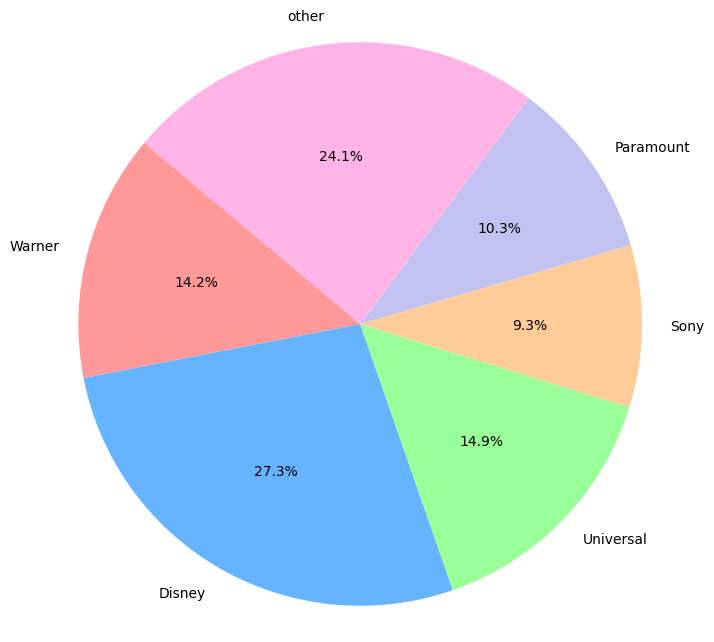

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
file_path = './final_cleaned_movie.csv'
data = pd.read_csv(file_path)

# Identify the production company columns and the adjusted revenue column
company_columns = [
    'production_companies_Warner',
    'production_companies_Disney',
    'production_companies_Universal',
    'production_companies_Sony',
    'production_companies_Paramount',
    'production_companies_other'
]

# Calculate the total adjusted revenue for each production company
company_revenues = {company: 0 for company in company_columns}
for company in company_columns:
    company_revenues[company] = data.loc[data[company] == 1, 'adj_revenue'].sum()

# Prepare data for the pie chart
labels = [company.replace('production_companies_', '') for company in company_columns]  # Clean up the labels
sizes = company_revenues.values()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6']

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie chart is drawn as a circle.
plt.show()


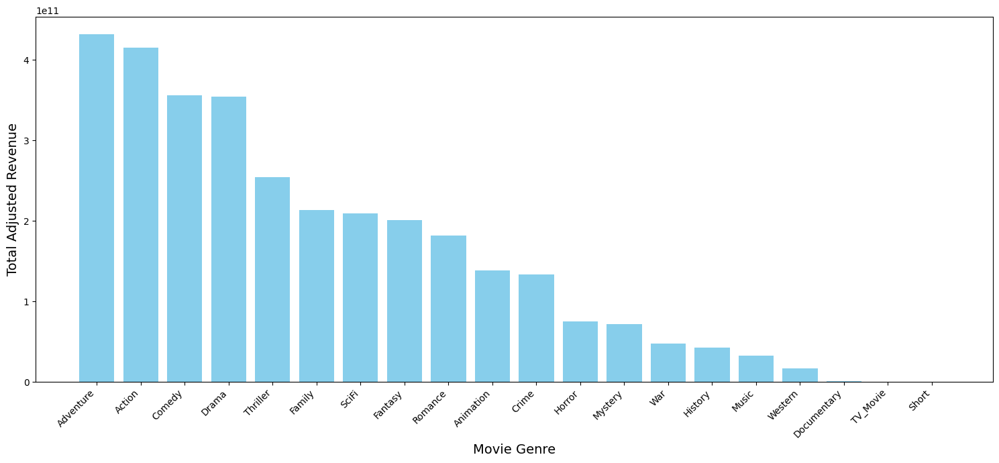

In [ ]:
# To display the relationship between revenue and movie genres, we first need to identify the genre columns in the dataset.
genre_columns = [col for col in data.columns if col not in company_columns and col.startswith(('Action', 'Adventure', 'Animation', 'Comedy', 'Crime', 'Documentary', 
                                         'Drama', 'Family', 'Fantasy', 'History', 'Horror', 'Music', 'Mystery', 'Romance', 'SciFi', 'Short', 'Thriller', 'TV_Movie', 
                                         'War', 'Western'))]

# Now let's calculate the total adjusted revenue for each movie genre.
genre_revenues = {genre: data.loc[data[genre] == 1, 'adj_revenue'].sum() for genre in genre_columns}

# Sort genres by total revenue
sorted_genres = sorted(genre_revenues.items(), key=lambda item: item[1], reverse=True)

# Now let's prepare the data for a bar chart.
genres, revenues = zip(*sorted_genres)  # This unzips the sorted list into two tuples

# Plotting the bar chart
plt.figure(figsize=(15, 7))
plt.bar(genres, revenues, color='skyblue')
plt.xlabel('Movie Genre', fontsize=14)
plt.ylabel('Total Adjusted Revenue', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # Adjust the padding between and around subplots.
plt.show()
# 從圖中可以看出，某些類型（如冒險和動作）的總收入顯著高於其他類型。

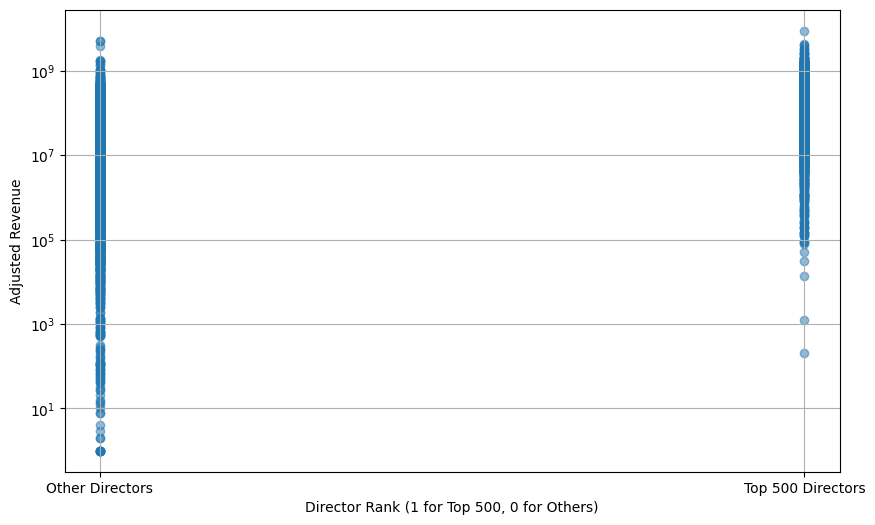

In [ ]:
# For this analysis, we will create a scatter plot showing the relationship between the director's ranking and the movie's adjusted revenue.

# Prepare the data for scatter plot
# We will use 'director_top' and 'director_other' as indicators of the director's rank and 'adj_revenue' for the revenue.

# To ensure meaningful scatter plot points, we need to filter out movies that do not have a director listed.
data_with_directors = data[(data['director_top'] > 0) | (data['director_other'] > 0)]

# Now, let's create a new column that will represent the director's rank in a binary form, 
# where a top director is marked with a higher rank (1) and others with a lower rank (0).
data_with_directors['director_rank'] = data_with_directors['director_top'].apply(lambda x: 1 if x > 0 else 0)

# Plotting the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(data_with_directors['director_rank'], data_with_directors['adj_revenue'], alpha=0.5)
plt.xlabel('Director Rank (1 for Top 500, 0 for Others)')
plt.ylabel('Adjusted Revenue')
plt.xticks([0, 1], ['Other Directors', 'Top 500 Directors'])
plt.yscale('log')  # Using a log scale for better visualization of revenue
plt.grid(True)
plt.show()
# 這樣的對數尺度可以更清晰地展示不同收入級別的電影。從圖中可以看出，由前500名導演執導的電影在收入上有較大的分散性，這表明頂級導演執導的電影可能在票房上有更高的潛在收入

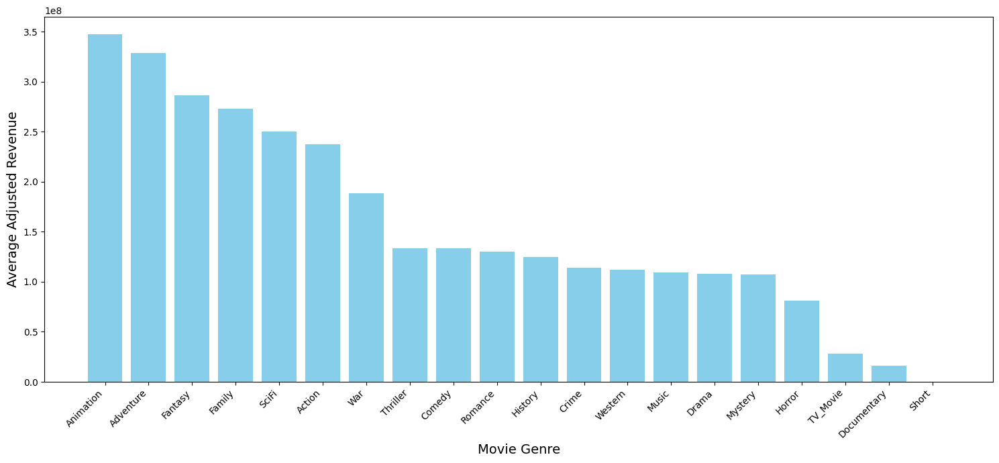

In [ ]:
# To display the relationship between revenue and movie genres, we first need to identify the genre columns in the dataset.
genre_columns = [col for col in data.columns if col not in company_columns and col.startswith(('Action', 'Adventure', 'Animation', 'Comedy', 'Crime', 'Documentary', 
                                         'Drama', 'Family', 'Fantasy', 'History', 'Horror', 'Music', 'Mystery', 'Romance', 'SciFi', 'Short', 'Thriller', 'TV_Movie', 
                                         'War', 'Western'))]

# Now let's calculate the average adjusted revenue for each movie genre.
genre_avg_revenues = {genre: data.loc[data[genre] == 1, 'adj_revenue'].mean() for genre in genre_columns}

# Sort genres by average revenue
sorted_genres = sorted(genre_avg_revenues.items(), key=lambda item: item[1], reverse=True)

# Now let's prepare the data for a bar chart.
genres, avg_revenues = zip(*sorted_genres)  # This unzips the sorted list into two tuples

# Plotting the bar chart
plt.figure(figsize=(15, 7))
plt.bar(genres, avg_revenues, color='skyblue')
plt.xlabel('Movie Genre', fontsize=14)
plt.ylabel('Average Adjusted Revenue', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # Adjust the padding between and around subplots.
plt.show()


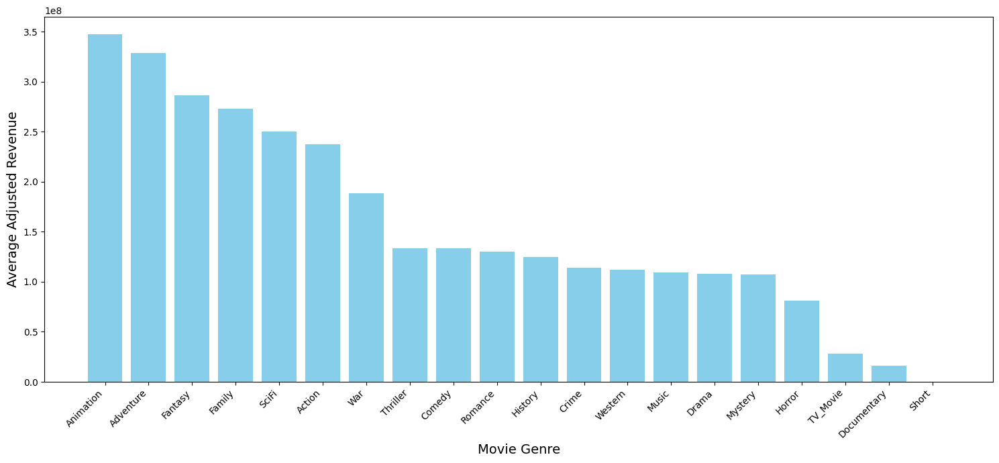

In [ ]:
# To display the relationship between revenue and movie genres, we first need to identify the genre columns in the dataset.
genre_columns = [col for col in data.columns if col not in company_columns and col.startswith(('Action', 'Adventure', 'Animation', 'Comedy', 'Crime', 'Documentary', 
                                         'Drama', 'Family', 'Fantasy', 'History', 'Horror', 'Music', 'Mystery', 'Romance', 'SciFi', 'Short', 'Thriller', 'TV_Movie', 
                                         'War', 'Western'))]

# Now let's calculate the average adjusted revenue for each movie genre.
genre_avg_revenues = {genre: data.loc[data[genre] == 1, 'adj_revenue'].mean() for genre in genre_columns}

# Sort genres by average revenue
sorted_genres = sorted(genre_avg_revenues.items(), key=lambda item: item[1], reverse=True)

# Now let's prepare the data for a bar chart.
genres, avg_revenues = zip(*sorted_genres)  # This unzips the sorted list into two tuples

# Plotting the bar chart
plt.figure(figsize=(15, 7))
plt.bar(genres, avg_revenues, color='skyblue')
plt.xlabel('Movie Genre', fontsize=14)
plt.ylabel('Average Adjusted Revenue', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # Adjust the padding between and around subplots.
plt.show()


C:\Users\student\AppData\Local\Temp\ipykernel_4384\1203146981.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_with_actors['actors_rank_top100'] = data_with_actors['starts100'].apply(lambda x: 1 if x > 0 else 0)
C:\Users\student\AppData\Local\Temp\ipykernel_4384\1203146981.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_with_actors['actors_rank_101_300'] = data_with_actors['starts300'].apply(lambda x: 1 if x > 0 else 0)
C:\Users\student\AppData\Local\Temp\ipykernel_4384\1203146981.py:13: 

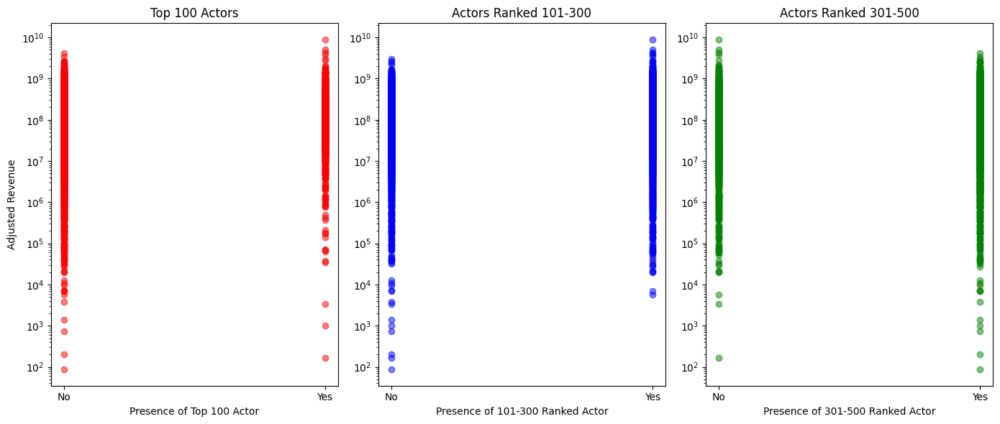

In [ ]:
# For this analysis, we will create a scatter plot showing the relationship between the actors' rankings and the movie's adjusted revenue.

# Prepare the data for scatter plot
# We will use 'starts100', 'starts300', and 'starts564' as indicators of the actors' rank and 'adj_revenue' for the revenue.

# To ensure meaningful scatter plot points, we need to filter out movies that do not have any listed actors.
data_with_actors = data[(data['starts100'] > 0) | (data['starts300'] > 0) | (data['starts564'] > 0)]

# Now, let's create new columns that will represent the actors' rank in a binary form, 
# where a higher number represents a higher rank.
data_with_actors['actors_rank_top100'] = data_with_actors['starts100'].apply(lambda x: 1 if x > 0 else 0)
data_with_actors['actors_rank_101_300'] = data_with_actors['starts300'].apply(lambda x: 1 if x > 0 else 0)
data_with_actors['actors_rank_301_564'] = data_with_actors['starts564'].apply(lambda x: 1 if x > 0 else 0)

# Now we will plot three separate scatter plots for each category of actor rankings.
plt.figure(figsize=(14, 6))

# Top 100 actors
plt.subplot(1, 3, 1)
plt.scatter(data_with_actors['actors_rank_top100'], data_with_actors['adj_revenue'], alpha=0.5, color='red')
plt.title('Top 100 Actors')
plt.xlabel('Presence of Top 100 Actor')
plt.ylabel('Adjusted Revenue')
plt.yscale('log')
plt.xticks([0, 1], ['No', 'Yes'])

# Actors ranked 101-300
plt.subplot(1, 3, 2)
plt.scatter(data_with_actors['actors_rank_101_300'], data_with_actors['adj_revenue'], alpha=0.5, color='blue')
plt.title('Actors Ranked 101-300')
plt.xlabel('Presence of 101-300 Ranked Actor')
plt.yscale('log')
plt.xticks([0, 1], ['No', 'Yes'])

# Actors ranked 301-564
plt.subplot(1, 3, 3)
plt.scatter(data_with_actors['actors_rank_301_564'], data_with_actors['adj_revenue'], alpha=0.5, color='green')
plt.title('Actors Ranked 301-500')
plt.xlabel('Presence of 301-500 Ranked Actor')
plt.yscale('log')
plt.xticks([0, 1], ['No', 'Yes'])

plt.tight_layout()
plt.show()


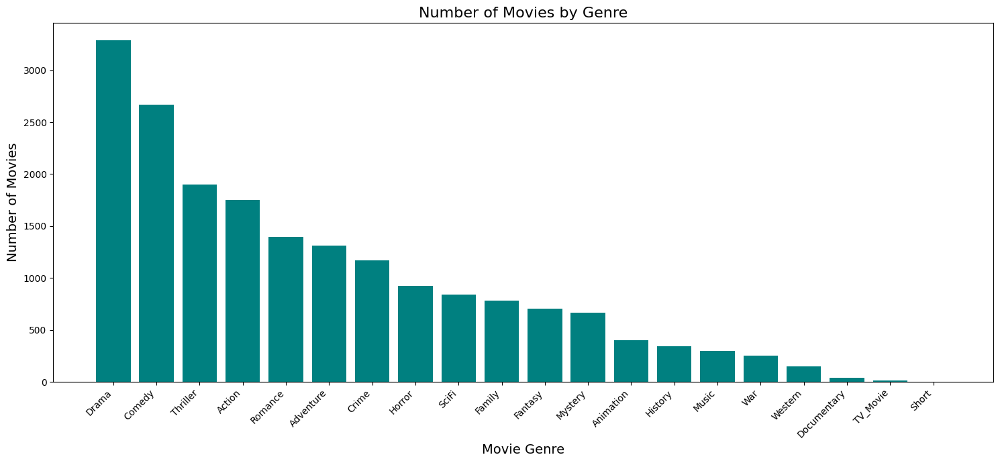

In [ ]:
# To display the number of movies per genre, we will sum up the number of times each genre column has a value of 1.

# Count the number of movies in each genre.
genre_movie_counts = data[genre_columns].sum().sort_values(ascending=False)

# Now let's prepare the data for a bar chart.
genres_count = genre_movie_counts.index.tolist()
counts = genre_movie_counts.values

# Plotting the bar chart
plt.figure(figsize=(15, 7))
plt.bar(genres_count, counts, color='teal')
plt.xlabel('Movie Genre', fontsize=14)
plt.ylabel('Number of Movies', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.title('Number of Movies by Genre', fontsize=16)
plt.tight_layout()  # Adjust the padding between and around subplots.
plt.show()


C:\Users\student\AppData\Local\Temp\ipykernel_4384\458607314.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(genres_count, rotation=45, ha='right')


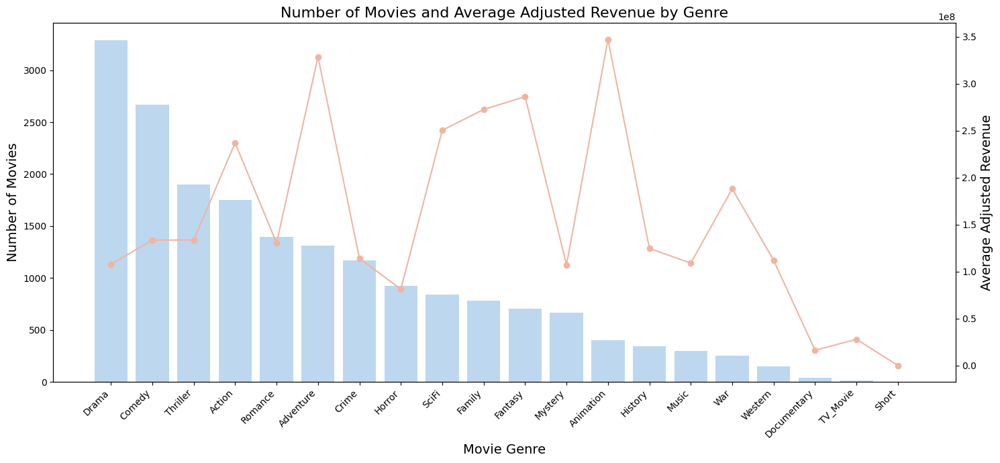

In [ ]:
# To combine the bar chart for the number of movies and the line plot for average adjusted revenue, we'll use a secondary y-axis.

# First, let's prepare the data for the combined chart.
genres_count = genre_movie_counts.index.tolist()
counts = genre_movie_counts.values
avg_revenues = [genre_avg_revenues[genre] for genre in genres_count]

# Create the bar chart with the counts.
fig, ax1 = plt.subplots(figsize=(15, 7))

color = '#BDD7EE'
ax1.set_xlabel('Movie Genre', fontsize=14)
ax1.set_ylabel('Number of Movies', fontsize=14)
ax1.bar(genres_count, counts, color=color)
ax1.tick_params(axis='y')
ax1.set_xticklabels(genres_count, rotation=45, ha='right')

# Create the line chart with the average revenues on the secondary y-axis.
ax2 = ax1.twinx()
color = '#EFB5A1'
ax2.set_ylabel('Average Adjusted Revenue', fontsize=14)
ax2.plot(genres_count, avg_revenues, color=color, marker='o')
ax2.tick_params(axis='y')

# Title and layout
plt.title('Number of Movies and Average Adjusted Revenue by Genre', fontsize=16)
fig.tight_layout()
plt.show()


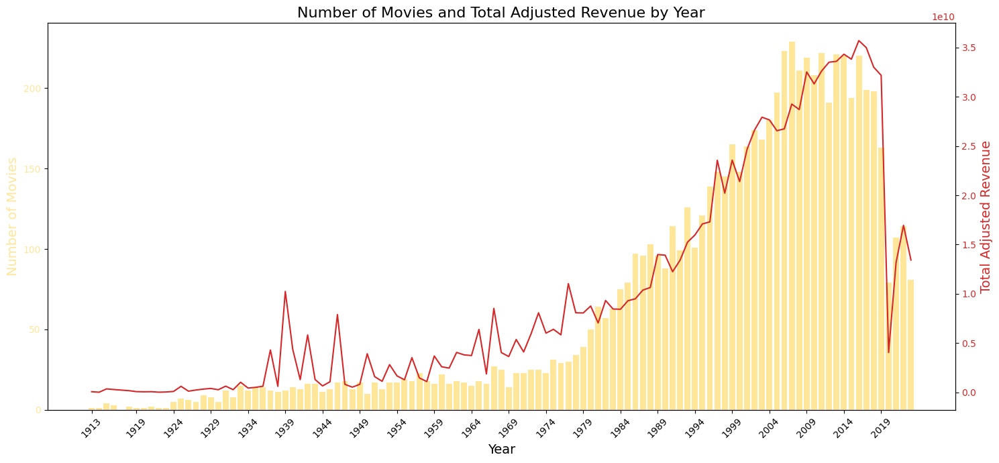

In [ ]:
# To compare the number of movies and total revenue by year, we first need to extract the year from the release dates.

# Convert release_date to datetime
data['release_date'] = pd.to_datetime(data['release_date'], errors='coerce')

# Extract year from release_date
data['release_year'] = data['release_date'].dt.year

# Now, let's calculate the number of movies and total adjusted revenue per year.
yearly_data = data.groupby('release_year').agg({'title':'count', 'adj_revenue':'sum'}).reset_index()

# Sort the dataframe by year
yearly_data = yearly_data.sort_values('release_year')

# Now let's prepare the data for a combined bar and line chart.
years = yearly_data['release_year']
movie_counts = yearly_data['title']
total_revenues = yearly_data['adj_revenue']

# Create the bar chart with the counts.
fig, ax1 = plt.subplots(figsize=(15, 7))

color = '#FFE699'
ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel('Number of Movies', fontsize=14, color=color)
ax1.bar(years, movie_counts, color=color, label='Number of Movies')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(years[::5])  # Show every 5th year for clarity
ax1.set_xticklabels(years[::5], rotation=45)

# Create the line chart with the total revenues on the secondary y-axis.
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Total Adjusted Revenue', fontsize=14, color=color)
ax2.plot(years, total_revenues, color=color, label='Total Adjusted Revenue')
ax2.tick_params(axis='y', labelcolor=color)

# Title and layout
plt.title('Number of Movies and Total Adjusted Revenue by Year', fontsize=16)
fig.tight_layout()
plt.show()


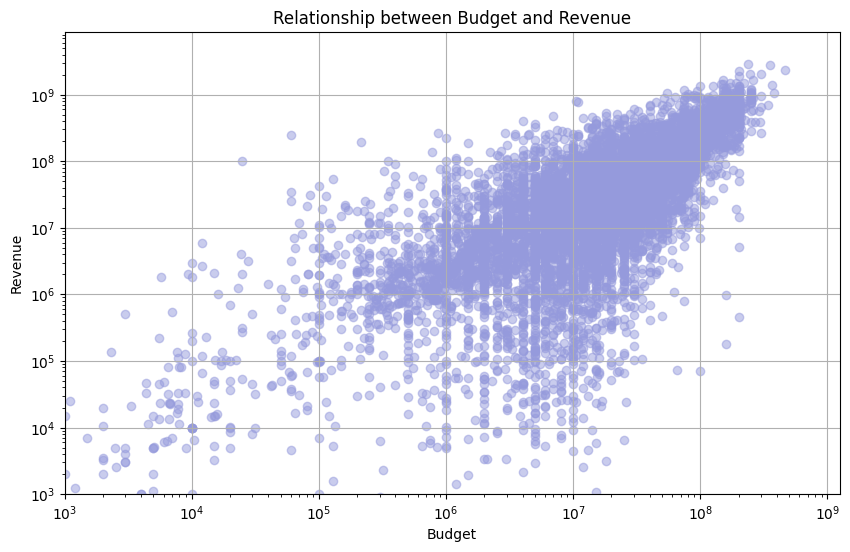

In [ ]:
# To compare revenue and budget, we will create a scatter plot to visualize the relationship between them.

# We need to filter out rows where budget or revenue is zero since it will not be meaningful in a scatter plot.
valid_data = data[(data['budget'] > 0) & (data['revenue'] > 0)]

# Now, let's plot the data.
plt.figure(figsize=(10, 6))
plt.scatter(valid_data['budget'], valid_data['revenue'], alpha=0.5, color = '#959ADC')
plt.title('Relationship between Budget and Revenue')
plt.xlabel('Budget')
plt.ylabel('Revenue')
plt.xscale('log')  # Log scale for better visualization
plt.yscale('log')
plt.xlim(left=1000)  # Set a lower limit to avoid cluttering at the lower end
plt.ylim(bottom=1000)
plt.grid(True)
plt.show()


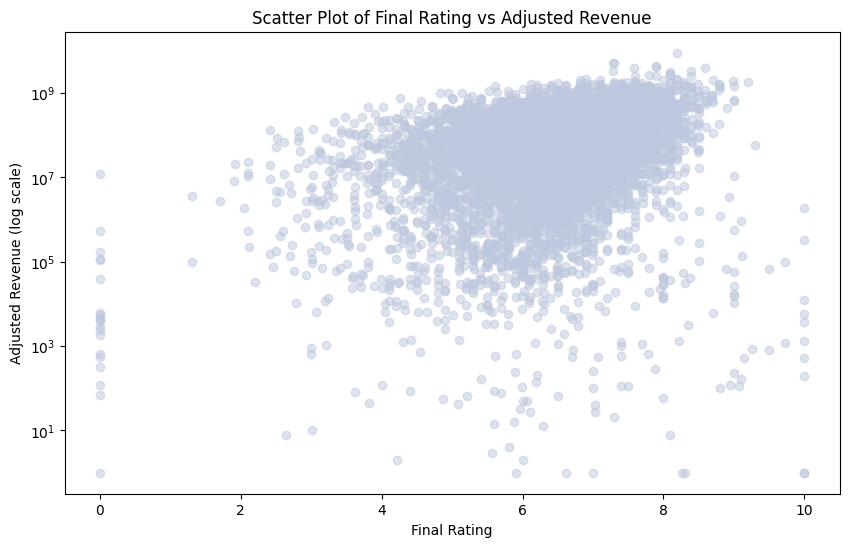

In [ ]:
# It appears there was an issue with the previous plotting attempt. Let's try once more.

# We will plot a scatter plot to show the relationship between 'final_rating' and 'adj_revenue'.
# Since 'adj_revenue' can span several orders of magnitude, we'll use a logarithmic scale on the y-axis.

plt.figure(figsize=(10, 6))

# Scatter plot
plt.scatter(data['final_rating'], data['adj_revenue'], alpha=0.5, color = '#BDC7DD')

# Log scale for the y-axis
plt.yscale('log')

# Labels and title
plt.xlabel('Final Rating')
plt.ylabel('Adjusted Revenue (log scale)')
plt.title('Scatter Plot of Final Rating vs Adjusted Revenue')

# Show the plot
plt.show()


# 散點圖中的點集中在評分4到8之間，這意味著大多數電影的評分落在這個範圍內。
# 高收入的電影似乎並不局限於最高的評分範圍，這表明即使評分不是最高，某些電影仍然可以實現高收入。
# 這幅圖沒有顯示出一個明顯的正相關或負相關趨勢，這意味著更高的評分並不一定對應著更高的收入，反之亦然。

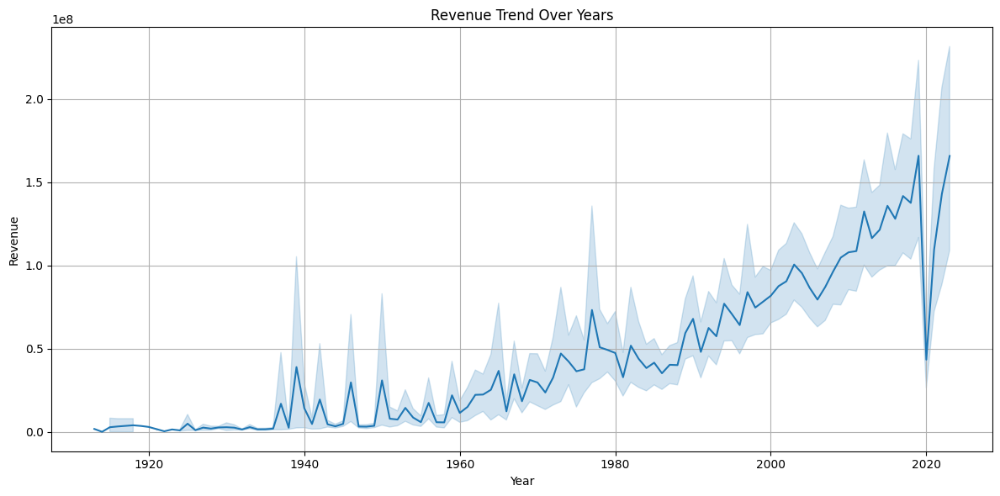

In [ ]:
import seaborn as sns
from datetime import datetime
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='release_year', y='revenue')
plt.title('Revenue Trend Over Years')
plt.xlabel('Year')
plt.ylabel('Revenue')
plt.grid(True)
plt.tight_layout()

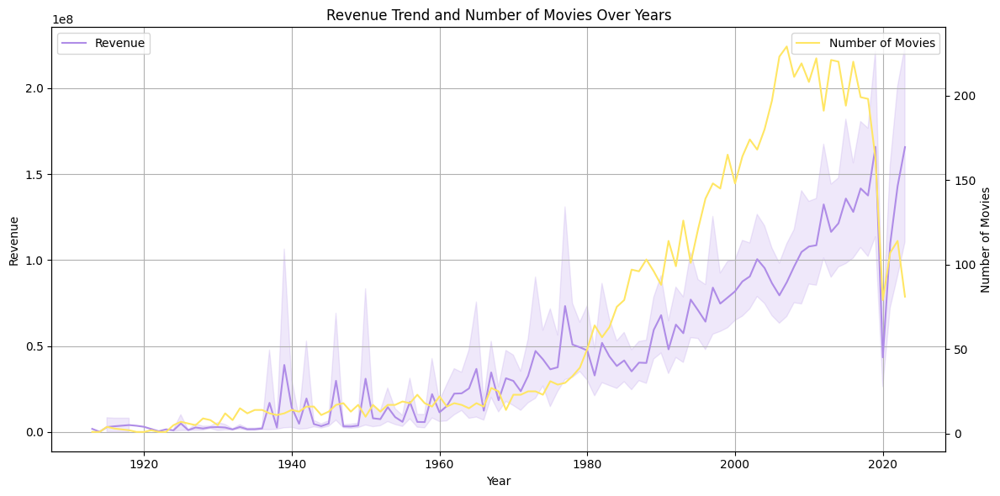

In [ ]:
# Counting the number of movies released each year
movies_per_year = data.groupby('release_year').size()

# Creating a secondary axis for the number of movies released per year
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot for Revenue
sns.lineplot(data=data, x='release_year', y='revenue', ax=ax1, color='#AF8CE7', label='Revenue')
ax1.set_title('Revenue Trend and Number of Movies Over Years')
ax1.set_xlabel('Year')
ax1.set_ylabel('Revenue')
ax1.tick_params(axis='y')
ax1.grid(True)

# Plot for Number of Movies
ax2 = ax1.twinx()
sns.lineplot(data=movies_per_year, color='#FFE664', ax=ax2, label='Number of Movies')
ax2.set_ylabel('Number of Movies')
ax2.tick_params(axis='y')

# Adding legend
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()


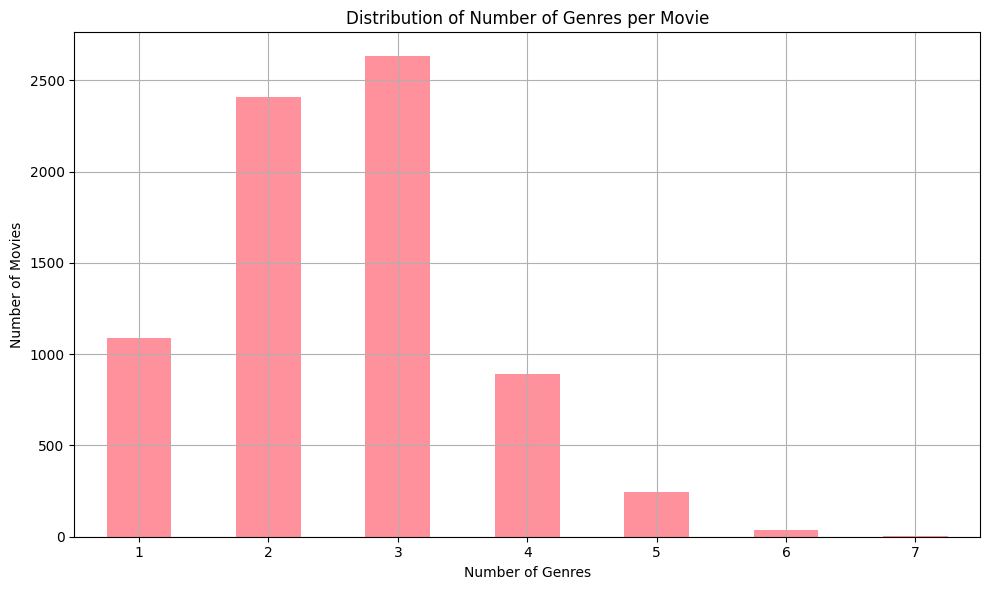

In [ ]:
# Counting the number of genres for each movie
data['num_genres'] = data[genre_columns].sum(axis=1)

# Calculating the distribution of the number of genres per movie
genre_count_distribution = data['num_genres'].value_counts().sort_index()

# Plotting the distribution
plt.figure(figsize=(10, 6))
genre_count_distribution.plot(kind='bar', color='#FF919C')
plt.title('Distribution of Number of Genres per Movie')
plt.xlabel('Number of Genres')
plt.ylabel('Number of Movies')
plt.xticks(rotation=0)
plt.grid(True)
plt.tight_layout()

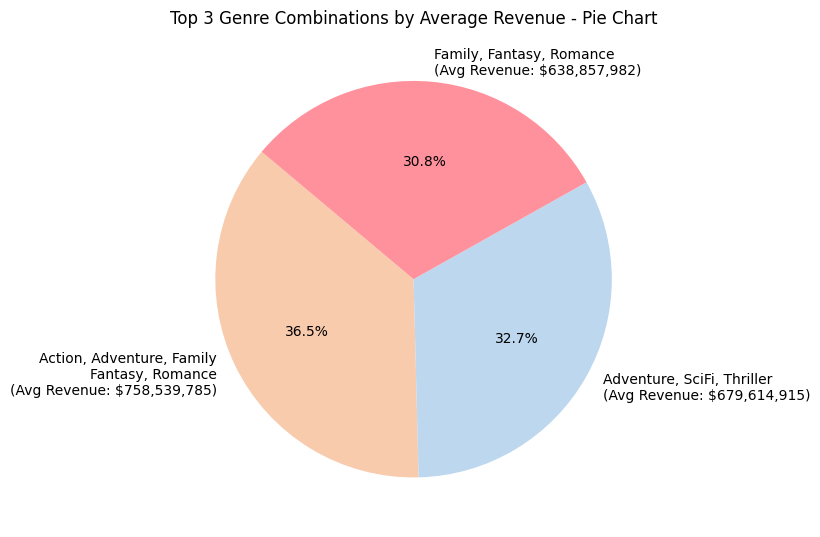

In [ ]:
# Creating a new column that combines all genre labels for each movie
data['genre_combination'] = data[genre_columns].apply(lambda row: ', '.join(row.index[row == 1]), axis=1)

# Grouping by genre combination and calculating the average revenue
average_revenue_by_genre = data.groupby('genre_combination')['revenue'].mean()

# Sorting to find the top 3 combinations with the highest average revenue
top_3_genre_combinations = average_revenue_by_genre.sort_values(ascending=False).head(3)

# Function to break the genre combination text every 3 commas for better readability
def break_text(text):
    split_text = text.split(', ')
    return '\n'.join([', '.join(split_text[i:i+3]) for i in range(0, len(split_text), 3)])

# Applying the text breaking function and adding average revenue to the labels
pie_labels = [f'{break_text(index)}\n(Avg Revenue: ${value:,.0f})' for index, value in top_3_genre_combinations.items()]

# Re-plotting the pie chart with the new labels
plt.figure(figsize=(8, 8))
plt.pie(top_3_genre_combinations, labels=pie_labels, autopct='%1.1f%%', startangle=140, colors=['#F8CBAD', '#BDD7EE', '#FF919C'])
plt.title('Top 3 Genre Combinations by Average Revenue - Pie Chart')
plt.tight_layout()



